In [1]:
!nvidia-smi

Wed Oct  9 16:18:28 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 551.86                 Driver Version: 551.86         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4060 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   36C    P8              5W /  115W |       0MiB /   8188MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [16]:
import torch
print(torch.cuda.get_device_name(0))
print(torch.cuda.is_available())
print(torch.__version__)

NVIDIA GeForce RTX 4060 Laptop GPU
True
2.4.1+cu124


In [17]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [9]:
!pip install PyYAML
!pip install ultralytics

In [3]:
import os
import time
import json
from zipfile import ZipFile
import tarfile
from shutil import copyfile
from dataclasses import dataclass, field

import yaml
import glob

import random
import numpy as np
import pandas as pd
import cv2
import requests

from ultralytics import YOLO

import matplotlib.pyplot as plt


In [2]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.4  Python-3.10.11 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Setup complete  (32 CPUs, 31.7 GB RAM, 462.5/476.0 GB disk)


In [4]:
# load pre-trained model
from ultralytics import YOLO

model = YOLO('yolov8m.pt')

In [5]:
print(type(model.names), len(model.names))
print(model.names)

<class 'dict'> 80
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell p

In [6]:
class_names = [
    "Chihuahua",
    "Japanese_spaniel",
    "Maltese_dog",
    "Pekinese",
    "Shih-Tzu",
    "Blenheim_spaniel",
    "Papillon",
    "Toy_terrier",
    "Rhodesian_ridgeback",
    "Afghan_hound",
    "Basset",
    "Beagle",
    "Bloodhound",
    "Bluetick",
    "Black-and-tan_coonhound",
    "Walker_hound",
    "English_foxhound",
    "Redbone",
    "Borzoi",
    "Irish_wolfhound",
    "Italian_greyhound",
    "Whippet",
    "Ibizan_hound",
    "Norwegian_elkhound",
    "Otterhound",
    "Saluki",
    "Scottish_deerhound",
    "Weimaraner",
    "Staffordshire_bullterrier",
    "American_Staffordshire_terrier",
    "Bedlington_terrier",
    "Border_terrier",
    "Kerry_blue_terrier",
    "Irish_terrier",
    "Norfolk_terrier",
    "Norwich_terrier",
    "Yorkshire_terrier",
    "Wire-haired_fox_terrier",
    "Lakeland_terrier",
    "Sealyham_terrier",
    "Airedale",
    "Cairn",
    "Australian_terrier",
    "Dandie_Dinmont",
    "Boston_bull",
    "Miniature_schnauzer",
    "Giant_schnauzer",
    "Standard_schnauzer",
    "Scotch_terrier",
    "Tibetan_terrier",
    "Silky_terrier",
    "Soft-coated_wheaten_terrier",
    "West_Highland_white_terrier",
    "Lhasa",
    "Flat-coated_retriever",
    "Curly-coated_retriever",
    "Golden_retriever",
    "Labrador_retriever",
    "Chesapeake_Bay_retriever",
    "German_short-haired_pointer",
    "Vizsla",
    "English_setter",
    "Irish_setter",
    "Gordon_setter",
    "Brittany_spaniel",
    "Clumber",
    "English_springer",
    "Welsh_springer_spaniel",
    "Cocker_spaniel",
    "Sussex_spaniel",
    "Irish_water_spaniel",
    "Kuvasz",
    "Schipperke",
    "Groenendael",
    "Malinois",
    "Briard",
    "Kelpie",
    "Komondor",
    "Old_English_sheepdog",
    "Shetland_sheepdog",
    "Collie",
    "Border_collie",
    "Bouvier_des_Flandres",
    "Rottweiler",
    "German_shepherd",
    "Doberman",
    "Miniature_pinscher",
    "Greater_Swiss_Mountain_dog",
    "Bernese_mountain_dog",
    "Appenzeller",
    "EntleBucher",
    "Boxer",
    "Bull_mastiff",
    "Tibetan_mastiff",
    "French_bulldog",
    "Great_Dane",
    "Saint_Bernard",
    "Eskimo_dog",
    "Malamute",
    "Siberian_husky",
    "Affenpinscher",
    "Basenji",
    "Pug",
    "Leonberg",
    "Newfoundland",
    "Great_Pyrenees",
    "Samoyed",
    "Pomeranian",
    "Chow",
    "Keeshond",
    "Brabancon_griffon",
    "Pembroke",
    "Cardigan",
    "Toy_poodle",
    "Miniature_poodle",
    "Standard_poodle",
    "Mexican_hairless",
    "Dingo",
    "Dhole",
    "African_hunting_dog"
]

# 딕셔너리 생성
class_dict = {i: class_names[i] for i in range(len(class_names))}

print(class_dict)


{0: 'Chihuahua', 1: 'Japanese_spaniel', 2: 'Maltese_dog', 3: 'Pekinese', 4: 'Shih-Tzu', 5: 'Blenheim_spaniel', 6: 'Papillon', 7: 'Toy_terrier', 8: 'Rhodesian_ridgeback', 9: 'Afghan_hound', 10: 'Basset', 11: 'Beagle', 12: 'Bloodhound', 13: 'Bluetick', 14: 'Black-and-tan_coonhound', 15: 'Walker_hound', 16: 'English_foxhound', 17: 'Redbone', 18: 'Borzoi', 19: 'Irish_wolfhound', 20: 'Italian_greyhound', 21: 'Whippet', 22: 'Ibizan_hound', 23: 'Norwegian_elkhound', 24: 'Otterhound', 25: 'Saluki', 26: 'Scottish_deerhound', 27: 'Weimaraner', 28: 'Staffordshire_bullterrier', 29: 'American_Staffordshire_terrier', 30: 'Bedlington_terrier', 31: 'Border_terrier', 32: 'Kerry_blue_terrier', 33: 'Irish_terrier', 34: 'Norfolk_terrier', 35: 'Norwich_terrier', 36: 'Yorkshire_terrier', 37: 'Wire-haired_fox_terrier', 38: 'Lakeland_terrier', 39: 'Sealyham_terrier', 40: 'Airedale', 41: 'Cairn', 42: 'Australian_terrier', 43: 'Dandie_Dinmont', 44: 'Boston_bull', 45: 'Miniature_schnauzer', 46: 'Giant_schnauzer'

# Stanford Dog 객체 학습

In [22]:
!pip show kaggle

Name: kaggle
Version: 1.6.17
Summary: Kaggle API
Home-page: https://github.com/Kaggle/kaggle-api
Author: Kaggle
Author-email: support@kaggle.com
License: Apache 2.0
Location: c:\users\rys\desktop\공부\it코리아\kdt\web_project3\animal\myenv\lib\site-packages
Requires: bleach, certifi, python-dateutil, python-slugify, requests, six, tqdm, urllib3
Required-by: 


In [23]:
!kaggle --version

Kaggle API 1.6.17


In [24]:
import os

# 데이터를 저장할 디렉토리 설정
save_dir = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal'

# 현재 작업 디렉토리를 저장 디렉토리로 변경
os.chdir(save_dir)

# Kaggle API를 사용하여 데이터셋 다운로드
!kaggle datasets download -d jessicali9530/stanford-dogs-dataset

print(f"데이터셋이 {save_dir}에 다운로드되었습니다.")

Dataset URL: https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset
License(s): other

데이터셋이 C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal에 다운로드되었습니다.



  0%|          | 0.00/750M [00:00<?, ?B/s]
  0%|          | 1.00M/750M [00:00<10:07, 1.29MB/s]
  0%|          | 2.00M/750M [00:00<05:02, 2.59MB/s]
  0%|          | 3.00M/750M [00:01<03:25, 3.82MB/s]
  1%|          | 5.00M/750M [00:01<02:08, 6.10MB/s]
  1%|          | 7.00M/750M [00:01<01:40, 7.78MB/s]
  1%|          | 9.00M/750M [00:01<01:26, 8.94MB/s]
  1%|▏         | 11.0M/750M [00:01<01:19, 9.80MB/s]
  2%|▏         | 13.0M/750M [00:01<01:14, 10.3MB/s]
  2%|▏         | 15.0M/750M [00:02<01:12, 10.7MB/s]
  2%|▏         | 17.0M/750M [00:02<01:10, 11.0MB/s]
  3%|▎         | 19.0M/750M [00:02<01:08, 11.1MB/s]
  3%|▎         | 21.0M/750M [00:02<01:07, 11.3MB/s]
  3%|▎         | 23.0M/750M [00:02<01:06, 11.4MB/s]
  3%|▎         | 25.0M/750M [00:03<01:06, 11.5MB/s]
  4%|▎         | 27.0M/750M [00:03<01:05, 11.6MB/s]
  4%|▍         | 29.0M/750M [00:03<01:05, 11.6MB/s]
  4%|▍         | 31.0M/750M [00:03<01:10, 10.7MB/s]
  4%|▍         | 33.0M/750M [00:03<01:08, 11.0MB/s]
  5%|▍         | 35.

In [ ]:
!pwd

/content/drive/MyDrive/KDT_240424/해커톤


In [ ]:
!ls

Stanford_dog_image.zip


In [26]:
%mkdir C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\stanford-dogs

In [28]:
# Extract zip
with ZipFile('C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs-dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs')

In [31]:
%mkdir C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs\txt

In [32]:
import os
import xml.etree.ElementTree as ET


def convert_bbox(size, box):
    dw = 1.0 / size[0]
    dh = 1.0 / size[1]
    x = (box[0] + box[1]) / 2.0
    y = (box[2] + box[3]) / 2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    x = x * dw
    w = w * dw
    y = y * dh
    h = h * dh
    return (x, y, w, h)

def convert_annotation(xml_file, class_dict):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    size = root.find('size')
    w = int(size.find('width').text)
    h = int(size.find('height').text)
    # print(w, h)
    lines = []

    # 값(value)을 키(key)로 하는 새로운 딕셔너리 생성
    reverse_class_dict = {v: k for k, v in class_dict.items()}

    for obj in root.iter('object'):
        cls = obj.find('name').text
        if cls not in reverse_class_dict:
            continue
        cls_id = reverse_class_dict[cls]
        xmlbox = obj.find('bndbox')
        b = (float(xmlbox.find('xmin').text), float(xmlbox.find('xmax').text), float(xmlbox.find('ymin').text), float(xmlbox.find('ymax').text))
        bb = convert_bbox((w,h), b)
        lines.append(f"{cls_id} {' '.join([str(a) for a in bb])}\n")

    return lines



Dog_label_path = 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/annotations/Annotation'
target_path = "C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/txt"

count = 0

# 경로 설정
xml_path = Dog_label_path
txt_path = target_path

# XML 파일을 YOLO 형식으로 변환
for folder in os.listdir(xml_path):
    folder_path = os.path.join(xml_path, folder)

    for xml_file in os.listdir(folder_path):

        xml_file_path = os.path.join(folder_path, xml_file)
        txt_file_path = os.path.join(txt_path, xml_file + '.txt')

        yolo_lines = convert_annotation(xml_file_path, class_dict)
        count += 1
        with open(txt_file_path, 'w') as f:
            f.writelines(yolo_lines)

print(f"{count}개 변환이 완료되었습니다.")

20580개 변환이 완료되었습니다.


In [33]:
import os
import shutil
import random

%mkdir C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs\train
%mkdir C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs\valid
%mkdir C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs\test

Dog_image_path = 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/images/Images'
training_set = 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/train'
validation_set = 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/valid'
test_set = 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/test'
txt_path = 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/txt'

# 훈련, 검증, 테스트 세트 디렉토리 생성
for dataset in [training_set, validation_set, test_set]:
    os.makedirs(os.path.join(dataset, 'images'), exist_ok=True)
    os.makedirs(os.path.join(dataset, 'labels'), exist_ok=True)


for folder in os.listdir(Dog_image_path):
    folder_path = os.path.join(Dog_image_path, folder)
    images = [img for img in os.listdir(folder_path) if os.path.exists(os.path.join(txt_path, os.path.splitext(img)[0] + '.txt'))]

    # 70% 훈련, 20% 검증, 10% 테스트로 분할
    num_images = len(images)
    num_train = int(num_images * 0.7)
    num_valid = int(num_images * 0.2)

    random.shuffle(images)
    train_images = images[:num_train]
    valid_images = images[num_train:num_train+num_valid]
    test_images = images[num_train+num_valid:]

    for image, dataset in zip(train_images + valid_images + test_images,
                              [training_set] * len(train_images) +
                              [validation_set] * len(valid_images) +
                              [test_set] * len(test_images)):
        # 이미지 복사
        src_image = os.path.join(folder_path, image)
        dst_image = os.path.join(dataset, 'images', image)
        shutil.copy2(src_image, dst_image)

        # 라벨 복사
        label_name = os.path.splitext(image)[0] + '.txt'
        src_label = os.path.join(txt_path, label_name)
        dst_label = os.path.join(dataset, 'labels', label_name)
        shutil.copy2(src_label, dst_label)

print("훈련 세트, 검증 세트, 테스트 세트 생성이 완료되었습니다.")

���� ������ �ùٸ��� �ʽ��ϴ�.
���� ������ �ùٸ��� �ʽ��ϴ�.
���� ������ �ùٸ��� �ʽ��ϴ�.


훈련 세트, 검증 세트, 테스트 세트 생성이 완료되었습니다.


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

image_path = 'New_Dog_Breeds/Stanford_dog_image/images/Images/n02085620-Chihuahua/n02085620_10976.jpg'

def load_image(image_path):
    image = Image.open(image_path)
    return image

def show_image(image):
    image.show()

bbox = np.loadtxt(fname=r'D:\kdt_240424\workspace\project3\AI_models\YOLOv8\New_Dog_Breeds\Stanford_dog_image\txt/n02085620_10976.txt')
print(bbox)

# bbox가 1차원 배열인 경우 2차원으로 변환
if bbox.ndim == 1:
    bbox = bbox.reshape(1, -1)

# YOLO 형식(중심 x, 중심 y, 너비, 높이)에서 (x_min, y_min, 너비, 높이) 형식으로 변환
image = load_image(image_path)

def myFig(image, bbox):
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    # 이미지 크기 가져오기
    width, height = image.size

    for box in bbox:
        # YOLO 형식(중심 x, 중심 y, 너비, 높이)에서 (x_min, y_min, 너비, 높이) 형식으로 변환
        x_center, y_center, w, h = box[1:5]
        x_min = (x_center - w/2) * width
        y_min = (y_center - h/2) * height
        box_width = w * width
        box_height = h * height

        rect = plt.Rectangle((x_min, y_min), box_width, box_height, fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)

    plt.axis('off')  # 축 제거
    plt.show()

# 함수 호출
myFig(image, bbox)

In [23]:
import yaml

data = {
    'train': 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/train',
    'val': 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/valid',
    'test': 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/test',
    'nc': 120,
    'names': list(class_dict.values())
}

with open('C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/dog_data.yaml', 'w') as f:
    yaml.dump(data, f, sort_keys=False)

with open('C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/dog_data.yaml', 'r') as f:
    dog_data = yaml.safe_load(f)
    print(dog_data)

{'train': 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/train', 'val': 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/valid', 'test': 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/stanford-dogs/test', 'nc': 120, 'names': ['Chihuahua', 'Japanese_spaniel', 'Maltese_dog', 'Pekinese', 'Shih-Tzu', 'Blenheim_spaniel', 'Papillon', 'Toy_terrier', 'Rhodesian_ridgeback', 'Afghan_hound', 'Basset', 'Beagle', 'Bloodhound', 'Bluetick', 'Black-and-tan_coonhound', 'Walker_hound', 'English_foxhound', 'Redbone', 'Borzoi', 'Irish_wolfhound', 'Italian_greyhound', 'Whippet', 'Ibizan_hound', 'Norwegian_elkhound', 'Otterhound', 'Saluki', 'Scottish_deerhound', 'Weimaraner', 'Staffordshire_bullterrier', 'American_Staffordshire_terrier', 'Bedlington_terrier', 'Border_terrier', 'Kerry_blue_terrier', 'Irish_terrier', 'Norfolk_terrier', 'Norwich_terrier', 'Yorkshire_terrier', 'Wire-haired_fox_terrier', 'Lakeland_terrier', 'Sealyham_terrier', 'Airedale', 'Cairn'

In [24]:
print(type(model.names), len(model.names))
print(model.names)

<class 'dict'> 80
{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell p

In [25]:
model.train(data='C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/dog_data.yaml', epochs=50, patience=5, batch=16, imgsz=640)

New https://pypi.org/project/ultralytics/8.3.6 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.4  Python-3.10.11 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: task=detect, mode=train, model=yolov8m.pt, data=C:/Users/RYS/Desktop//IT/KDT/Web_project3/Animal/dog_data.yaml, epochs=50, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, r

train: Scanning C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\stanford-dogs\train\labels.cache... 14355 images, 5255 backgrounds, 0 corrupt: 100%|██████████| 14355/14355 [00:00<?, ?it/s]

train: WARNING  C:\Users\RYS\Desktop\\IT\KDT\Web_project3\Animal\stanford-dogs\train\images\n02089973_1763.jpg: corrupt JPEG restored and saved



val: Scanning C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\stanford-dogs\valid\labels.cache... 4072 images, 1491 backgrounds, 0 corrupt: 100%|██████████| 4072/4072 [00:00<?, ?it/s]


Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 83 weight(decay=0.0), 90 weight(decay=0.0005), 89 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      7.77G     0.6534      4.799      1.238          9        640: 100%|██████████| 898/898 [06:23<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:10<00:00,  1.82it/s]


                   all       4072       2800     0.0869      0.186     0.0665     0.0552

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      7.77G     0.7883      3.751        1.3          5        640: 100%|██████████| 898/898 [06:02<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [04:01<00:00,  1.88s/it]

                   all       4072       2800      0.181      0.353      0.168      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.76G     0.9245      3.547      1.396          6        640: 100%|██████████| 898/898 [12:20<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:17<00:00,  1.66it/s]


                   all       4072       2800      0.198      0.282      0.125     0.0842

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      7.75G     0.9803      3.401      1.421          4        640: 100%|██████████| 898/898 [07:32<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:42<00:00,  1.27s/it]


                   all       4072       2800      0.273      0.354      0.217      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50       7.9G     0.9184      2.976      1.372          4        640: 100%|██████████| 898/898 [06:01<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:13<00:00,  1.74it/s]

                   all       4072       2800      0.245      0.361      0.237      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.76G      0.875      2.667      1.333          5        640: 100%|██████████| 898/898 [05:57<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:43<00:00,  1.28s/it]


                   all       4072       2800      0.339      0.392      0.308      0.235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50       7.9G     0.8347      2.455      1.304          6        640: 100%|██████████| 898/898 [06:02<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:12<00:00,  1.77it/s]

                   all       4072       2800      0.407      0.473      0.421      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.74G     0.8139      2.299      1.288          6        640: 100%|██████████| 898/898 [05:57<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:50<00:00,  1.33s/it]


                   all       4072       2800      0.431      0.483      0.461      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.89G     0.7937      2.197      1.273          7        640: 100%|██████████| 898/898 [06:26<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:14<00:00,  1.72it/s]

                   all       4072       2800      0.506      0.505      0.515       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.73G       0.77      2.095       1.26          6        640: 100%|██████████| 898/898 [05:58<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:53<00:00,  1.36s/it]

                   all       4072       2800      0.496      0.577      0.552      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.88G     0.7585      2.003      1.248          7        640: 100%|██████████| 898/898 [06:37<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:20<00:00,  1.59it/s]

                   all       4072       2800      0.497      0.599      0.584      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      7.76G      0.745      1.924      1.241          9        640: 100%|██████████| 898/898 [05:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:52<00:00,  1.34s/it]


                   all       4072       2800       0.54      0.591      0.606      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.88G     0.7326      1.869      1.231          5        640: 100%|██████████| 898/898 [06:35<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:22<00:00,  1.55it/s]

                   all       4072       2800      0.548      0.608      0.611      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.75G     0.7163       1.81       1.22          7        640: 100%|██████████| 898/898 [05:57<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:54<00:00,  1.36s/it]


                   all       4072       2800       0.56      0.634      0.639      0.542

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.89G     0.6978      1.733      1.206          3        640: 100%|██████████| 898/898 [06:36<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:22<00:00,  1.55it/s]

                   all       4072       2800      0.605      0.645      0.659      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.75G     0.6935      1.707      1.202          3        640: 100%|██████████| 898/898 [05:57<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:42<00:00,  1.27s/it]

                   all       4072       2800      0.629      0.608      0.655      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.89G       0.68      1.663      1.194          4        640: 100%|██████████| 898/898 [06:36<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:20<00:00,  1.58it/s]

                   all       4072       2800      0.629      0.642      0.687      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.76G     0.6671      1.608      1.186          8        640: 100%|██████████| 898/898 [05:57<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:46<00:00,  1.30s/it]


                   all       4072       2800      0.629      0.679      0.708       0.61

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50       7.9G      0.662      1.573      1.181          8        640: 100%|██████████| 898/898 [06:36<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:23<00:00,  1.54it/s]

                   all       4072       2800      0.643      0.697      0.719      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.73G     0.6501       1.52      1.171          8        640: 100%|██████████| 898/898 [05:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:32<00:00,  1.19s/it]

                   all       4072       2800      0.668      0.698      0.732      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      7.88G     0.6465      1.491       1.17          5        640: 100%|██████████| 898/898 [06:34<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:21<00:00,  1.57it/s]

                   all       4072       2800      0.667      0.715      0.745      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.74G     0.6354      1.453      1.163          7        640: 100%|██████████| 898/898 [05:57<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:55<00:00,  1.37s/it]


                   all       4072       2800      0.693        0.7       0.75      0.655

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50       7.9G     0.6257      1.415      1.157          4        640: 100%|██████████| 898/898 [06:26<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:16<00:00,  1.68it/s]

                   all       4072       2800      0.701      0.703      0.756      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      7.75G     0.6167      1.381      1.152          7        640: 100%|██████████| 898/898 [05:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:40<00:00,  1.26s/it]

                   all       4072       2800      0.735      0.695      0.766      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.88G     0.6196      1.369      1.153          7        640: 100%|██████████| 898/898 [06:34<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:21<00:00,  1.58it/s]

                   all       4072       2800      0.711      0.714      0.774      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      7.73G     0.6061      1.309      1.144          9        640: 100%|██████████| 898/898 [05:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:57<00:00,  1.38s/it]

                   all       4072       2800      0.733      0.724      0.781      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      7.89G     0.6001      1.296      1.138          3        640: 100%|██████████| 898/898 [06:40<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:19<00:00,  1.60it/s]

                   all       4072       2800      0.743      0.712      0.781      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      7.76G     0.5977      1.264      1.136         11        640: 100%|██████████| 898/898 [05:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:42<00:00,  1.27s/it]

                   all       4072       2800      0.747      0.731      0.791      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      7.88G     0.5804       1.23      1.125          8        640: 100%|██████████| 898/898 [06:34<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:19<00:00,  1.61it/s]

                   all       4072       2800      0.726      0.759      0.797      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      7.75G     0.5867      1.226      1.128          8        640: 100%|██████████| 898/898 [05:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:45<00:00,  1.29s/it]

                   all       4072       2800      0.728      0.754      0.796       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.89G     0.5779      1.192      1.125          2        640: 100%|██████████| 898/898 [06:35<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:23<00:00,  1.54it/s]

                   all       4072       2800       0.72      0.767      0.803      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      7.74G     0.5694      1.162      1.116          5        640: 100%|██████████| 898/898 [05:58<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:59<00:00,  1.40s/it]

                   all       4072       2800      0.741       0.75      0.806      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      7.91G     0.5656       1.15      1.114          9        640: 100%|██████████| 898/898 [06:35<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:21<00:00,  1.57it/s]

                   all       4072       2800      0.791      0.726      0.812      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      7.75G     0.5585      1.126      1.108          8        640: 100%|██████████| 898/898 [05:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:36<00:00,  1.23s/it]

                   all       4072       2800      0.769      0.742      0.812      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50       7.9G     0.5517      1.084      1.103          3        640: 100%|██████████| 898/898 [06:35<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:21<00:00,  1.57it/s]

                   all       4072       2800      0.774      0.757       0.82      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      7.75G     0.5431      1.071      1.099          2        640: 100%|██████████| 898/898 [05:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:53<00:00,  1.35s/it]

                   all       4072       2800      0.782      0.741      0.818      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       7.9G      0.534       1.04      1.093          3        640: 100%|██████████| 898/898 [06:35<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:21<00:00,  1.57it/s]

                   all       4072       2800      0.766       0.76      0.821      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      7.76G     0.5351      1.029      1.094          6        640: 100%|██████████| 898/898 [05:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:47<00:00,  1.31s/it]

                   all       4072       2800      0.758      0.769      0.821       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      7.88G     0.5297      1.003      1.089          6        640: 100%|██████████| 898/898 [06:24<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:11<00:00,  1.78it/s]

                   all       4072       2800       0.79      0.755      0.827      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.75G     0.5238     0.9789      1.087          3        640: 100%|██████████| 898/898 [05:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:57<00:00,  1.38s/it]

                   all       4072       2800      0.787      0.762      0.828      0.746


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50       7.9G     0.3467     0.5125     0.9776          2        640: 100%|██████████| 898/898 [06:34<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:24<00:00,  1.51it/s]

                   all       4072       2800      0.775      0.758      0.824      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      7.74G     0.3335     0.4606     0.9719          2        640: 100%|██████████| 898/898 [05:55<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [03:52<00:00,  1.82s/it]

                   all       4072       2800      0.762      0.765      0.825      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.89G     0.3284     0.4279     0.9647          2        640: 100%|██████████| 898/898 [05:55<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:09<00:00,  1.85it/s]

                   all       4072       2800       0.79      0.754      0.827      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      7.74G      0.313     0.3966     0.9537          2        640: 100%|██████████| 898/898 [05:55<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [02:49<00:00,  1.33s/it]

                   all       4072       2800      0.794      0.755      0.829      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       7.9G     0.3084      0.376     0.9475          3        640: 100%|██████████| 898/898 [06:33<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:22<00:00,  1.55it/s]

                   all       4072       2800      0.809      0.742      0.828      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      7.75G     0.3002     0.3582     0.9396          3        640: 100%|██████████| 898/898 [05:55<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [04:20<00:00,  2.03s/it]


                   all       4072       2800      0.785      0.755      0.828      0.748

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50       7.9G     0.2942     0.3264     0.9379          4        640: 100%|██████████| 898/898 [05:55<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:10<00:00,  1.81it/s]

                   all       4072       2800      0.795      0.746      0.827      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      7.73G      0.286     0.3082     0.9303          3        640: 100%|██████████| 898/898 [05:55<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [03:59<00:00,  1.87s/it]


                   all       4072       2800       0.81      0.733      0.827      0.746

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.88G     0.2796     0.2845     0.9237          2        640: 100%|██████████| 898/898 [05:55<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [01:12<00:00,  1.76it/s]

                   all       4072       2800      0.804       0.74      0.827      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      7.74G      0.276     0.2782      0.921          1        640: 100%|██████████| 898/898 [05:55<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [03:04<00:00,  1.44s/it]

                   all       4072       2800      0.777      0.765      0.827      0.747



50 epochs completed in 7.110 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 46.9MB
Optimizer stripped from runs\detect\train\weights\best.pt, 46.9MB

Validating runs\detect\train\weights\best.pt...
Ultralytics 8.3.4  Python-3.10.11 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 236 layers, 23,272,312 parameters, 0 gradients, 67.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 128/128 [00:29<00:00,  4.41it/s]


                   all       4072       2800      0.786      0.753      0.828      0.747
             Chihuahua         30         30      0.764        0.7      0.761      0.645
      Japanese_spaniel         37         41       0.92      0.845      0.914      0.792
           Maltese_dog         50         52      0.778      0.743      0.863      0.748
              Pekinese         29         29      0.911      0.828      0.933      0.852
              Shih-Tzu         42         48      0.754      0.703      0.776      0.669
      Blenheim_spaniel         37         44      0.921      0.841      0.918      0.786
   Rhodesian_ridgeback         34         37      0.647      0.595      0.736      0.686
          Afghan_hound         47         61      0.982      0.951      0.961      0.884
          Walker_hound         30         33      0.749      0.394      0.647      0.548
      English_foxhound         31         42      0.787      0.615       0.77      0.696
       Irish_wolfhoun

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([  0,   1,   2,   3,   4,   5,   8,   9,  15,  16,  19,  20,  22,  23,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  38,  39,  40,  42,  43,  44,  48,  49,  52,  53,  57,  58,  59,  61,  62,  63,  64,  66,  67,  69,  70,  78,  79,  81,  82,  83,  84,  85,  87,  88,  89,  90,  93,  94,  95,  96,
        97,  99, 103, 104, 105, 106, 107, 110, 111, 112, 116, 119])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001B53ADBB370>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002, 

In [26]:
# 모델이 학습 되었는 체크 (학습 되었으면 바뀌는거 확인)
print(type(model.names), len(model.names))
print(model.names)

<class 'dict'> 120
{0: 'Chihuahua', 1: 'Japanese_spaniel', 2: 'Maltese_dog', 3: 'Pekinese', 4: 'Shih-Tzu', 5: 'Blenheim_spaniel', 6: 'Papillon', 7: 'Toy_terrier', 8: 'Rhodesian_ridgeback', 9: 'Afghan_hound', 10: 'Basset', 11: 'Beagle', 12: 'Bloodhound', 13: 'Bluetick', 14: 'Black-and-tan_coonhound', 15: 'Walker_hound', 16: 'English_foxhound', 17: 'Redbone', 18: 'Borzoi', 19: 'Irish_wolfhound', 20: 'Italian_greyhound', 21: 'Whippet', 22: 'Ibizan_hound', 23: 'Norwegian_elkhound', 24: 'Otterhound', 25: 'Saluki', 26: 'Scottish_deerhound', 27: 'Weimaraner', 28: 'Staffordshire_bullterrier', 29: 'American_Staffordshire_terrier', 30: 'Bedlington_terrier', 31: 'Border_terrier', 32: 'Kerry_blue_terrier', 33: 'Irish_terrier', 34: 'Norfolk_terrier', 35: 'Norwich_terrier', 36: 'Yorkshire_terrier', 37: 'Wire-haired_fox_terrier', 38: 'Lakeland_terrier', 39: 'Sealyham_terrier', 40: 'Airedale', 41: 'Cairn', 42: 'Australian_terrier', 43: 'Dandie_Dinmont', 44: 'Boston_bull', 45: 'Miniature_schnauzer', 46

In [ ]:
import shutil

# /content/runs 디렉토리를 zip 파일로 압축
shutil.make_archive('/contentC:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/runs_backup', 'zip', 'C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/runs')

# 생성된 zip 파일을 다운로드
files.download('C:/Users/RYS/Desktop/공부/IT코리아/KDT/Web_project3/Animal/runs_backup.zip')

In [43]:
# 만든 모델 검증

from ultralytics import YOLO

# 모델 불러오기
model = YOLO('yolov8m.pt')  # 공식 모델 불러오기
model = YOLO(r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\runs\detect\train\weights\best.pt')  # 사용자 모델 가중치 불러오기

# 모델 검증
metrics = model.val()  # 데이터셋 및 설정을 기억하므로 인수 필요 없음C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\runs\detect\train\weights\best.pt
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps   # 각 범주의 map50-95를 포함하는 리스트

Ultralytics 8.3.4  Python-3.10.11 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 236 layers, 23,272,312 parameters, 0 gradients, 67.8 GFLOPs


val: Scanning C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\stanford-dogs\valid\labels.cache... 4072 images, 1491 backgrounds, 0 corrupt: 100%|██████████| 4072/4072 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 255/255 [00:48<00:00,  5.24it/s]


                   all       4072       2800      0.683      0.693      0.732       0.66
             Chihuahua         30         30      0.524      0.515      0.618      0.522
      Japanese_spaniel         37         41       0.95      0.829      0.884      0.741
           Maltese_dog         50         52      0.758      0.808      0.886      0.727
              Pekinese         29         29       0.77      0.552      0.658       0.62
              Shih-Tzu         42         48      0.734      0.746      0.778       0.66
      Blenheim_spaniel         37         44      0.802      0.826      0.842      0.732
   Rhodesian_ridgeback         34         37      0.576      0.378      0.518      0.488
          Afghan_hound         47         61      0.885      0.902      0.945      0.871
          Walker_hound         30         33      0.433      0.455       0.47      0.435
      English_foxhound         31         42       0.59      0.514       0.58      0.517
       Irish_wolfhoun

array([    0.52243,      0.7408,     0.72728,     0.61995,     0.66039,     0.73183,     0.66033,     0.66033,     0.48765,     0.87106,     0.66033,     0.66033,     0.66033,     0.66033,     0.66033,      0.4349,     0.51717,     0.66033,     0.66033,     0.62963,     0.45407,     0.66033,     0.75381,     0.81812,
           0.66033,     0.83798,     0.73636,     0.63891,     0.31882,     0.47268,     0.90005,     0.80817,     0.84193,     0.68502,     0.63829,     0.62139,     0.37099,     0.66033,     0.58557,     0.67182,     0.75429,     0.66033,     0.48215,     0.69123,     0.79428,     0.66033,     0.66033,     0.66033,
            0.7283,     0.65115,     0.66033,     0.66033,      0.5194,     0.45933,     0.66033,     0.66033,     0.66033,     0.44898,     0.72305,     0.69805,     0.66033,     0.63689,     0.77393,     0.74757,     0.59831,     0.66033,     0.72195,     0.62527,     0.66033,     0.84276,     0.62246,     0.66033,
           0.66033,     0.66033,     0.6603

In [ ]:
ckpt_path  = os.path.join(train_config.PROJECT, train_config.NAME, "weights", "best.pt")
model_pose = YOLO(ckpt_path)

metrics = model_pose.val()

In [ ]:
# 만든 모델 예측 및 테스트
from ultralytics import YOLO

# 모델 불러오기
model = YOLO('yolov8m-pose.pt')  # 공식 모델 불러오기
model = YOLO('path/to/best.pt')  # 사용자 모델 불러오기

# 모델로 예측하기
results = model.predict(source='/content/test/images/')  # 이미지에서 예측

# Stanford Dog Pose 학습 (수정필요)


In [11]:
def download_and_unzip(url, save_path):

    print("Downloading and extracting assets...", end="")
    file = requests.get(url)
    open(save_path, "wb").write(file.content)

    try:
        # Extract tarfile.
        if save_path.endswith(".tar"):
            with tarfile.open(save_path, "r") as tar:
                tar.extractall(os.path.split(save_path)[0])

        print("Done")
    except:
        print("Invalid file")

In [12]:
IMAGES_URL = r"http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar"
IMAGES_DIR = "Images"
IMAGES_TAR_PATH = os.path.join(os.getcwd(), f"{IMAGES_DIR}.tar")

ANNS_METADATA_URL = r"https://github.com/benjiebob/StanfordExtra/raw/master/keypoint_definitions.csv"
ANNS_METADATA = "keypoint_definitions.csv"

# Download if dataset does not exists.
if not os.path.exists(IMAGES_DIR):
    download_and_unzip(IMAGES_URL, IMAGES_TAR_PATH)
    os.remove(IMAGES_TAR_PATH)

if not os.path.isfile(ANNS_METADATA):
    download_and_unzip(ANNS_METADATA_URL, ANNS_METADATA)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [16]:
# ANN_PATH = "StanfordExtra_V12"
ANN_PATH = r"C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\StanfordExtra_V12"
JSON_PATH = os.path.join(ANN_PATH, "StanfordExtra_v12.json")

with open(JSON_PATH) as file:
    json_data = json.load(file)

In [17]:
train_ids = np.load(os.path.join(ANN_PATH, "train_stanford_StanfordExtra_v12.npy"))
val_ids = np.load(os.path.join(ANN_PATH, "test_stanford_StanfordExtra_v12.npy"))

print(f"Train: {len(train_ids)}")
print(f"Val: {len(val_ids)}")

Train: 6773
Val: 1703


In [13]:
DATA_DIR = "animal-pose-data"

TRAIN_DIR         = f"train"
TRAIN_FOLDER_IMG    = f"images"
TRAIN_FOLDER_LABELS = f"labels"

TRAIN_IMG_PATH   = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_IMG)
TRAIN_LABEL_PATH = os.path.join(DATA_DIR, TRAIN_DIR, TRAIN_FOLDER_LABELS)

VALID_DIR           = f"valid"
VALID_FOLDER_IMG    = f"images"
VALID_FOLDER_LABELS = f"labels"

VALID_IMG_PATH   = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_IMG)
VALID_LABEL_PATH = os.path.join(DATA_DIR, VALID_DIR, VALID_FOLDER_LABELS)

os.makedirs(TRAIN_IMG_PATH, exist_ok=True)
os.makedirs(TRAIN_LABEL_PATH, exist_ok=True)
os.makedirs(VALID_IMG_PATH, exist_ok=True)
os.makedirs(VALID_LABEL_PATH, exist_ok=True)

In [19]:
train_json_data = []
for train_id in train_ids:
    train_json_data.append(json_data[train_id])

val_json_data = []
for val_id in val_ids:
    val_json_data.append(json_data[val_id])

In [20]:
for data in train_json_data:
    img_file = data["img_path"]
    filename = img_file.split("/")[-1]
    copyfile(os.path.join(IMAGES_DIR, img_file),
             os.path.join(TRAIN_IMG_PATH, filename))


for data in val_json_data:
    img_file = data["img_path"]
    filename = img_file.split("/")[-1]
    copyfile(os.path.join(IMAGES_DIR, img_file),
             os.path.join(VALID_IMG_PATH, filename))

In [21]:
CLASS_ID = 0

In [22]:
def create_yolo_boxes_kpts(img_size, boxes, lm_kpts):

    IMG_W, IMG_H = img_size
    # Modify kpts with visibilities as 1s to 2s.
    vis_ones = np.where(lm_kpts[:, -1] == 1.)
    lm_kpts[vis_ones, -1] = 2.

    # Normalizing factor for bboxes and kpts.
    res_box_array = np.array([IMG_W, IMG_H, IMG_W, IMG_H])
    res_lm_array = np.array([IMG_W, IMG_H])

    # Normalize landmarks in the range [0,1].
    norm_kps_per_img = lm_kpts.copy()
    norm_kps_per_img[:, :-1]  = norm_kps_per_img[:, :-1] / res_lm_array

    # Normalize bboxes in the range [0,1].
    norm_bbox_per_img = boxes / res_box_array

    # Create bboxes coordinates to YOLO.
    # x_c, y_c = x_min + bbox_w/2. , y_min + bbox_h/2.
    yolo_boxes = norm_bbox_per_img.copy()
    yolo_boxes[:2] = norm_bbox_per_img[:2] + norm_bbox_per_img[2:]/2.

    return yolo_boxes, norm_kps_per_img

def create_yolo_txt_files(json_data, LABEL_PATH):

    for data in json_data:

        IMAGE_ID = data["img_path"].split("/")[-1].split(".")[0]

        IMG_WIDTH, IMG_HEIGHT = data["img_width"], data["img_height"]

        landmark_kpts  = np.nan_to_num(np.array(data["joints"], dtype=np.float32))
        landmarks_bboxes = np.array(data["img_bbox"], dtype=np.float32)

        bboxes_yolo, kpts_yolo = create_yolo_boxes_kpts(
                                            (IMG_WIDTH, IMG_HEIGHT),
                                            landmarks_bboxes,
                                            landmark_kpts)

        TXT_FILE = IMAGE_ID+".txt"

        with open(os.path.join(LABEL_PATH, TXT_FILE), "w") as f:

            x_c_norm, y_c_norm, box_width_norm, box_height_norm = round(bboxes_yolo[0],5),\
                                                                  round(bboxes_yolo[1],5),\
                                                                  round(bboxes_yolo[2],5),\
                                                                  round(bboxes_yolo[3],5),\

            kps_flattend = [round(ele,5) for ele in kpts_yolo.flatten().tolist()]
            line = f"{CLASS_ID} {x_c_norm} {y_c_norm} {box_width_norm} {box_height_norm} "
            line+= " ".join(map(str, kps_flattend))
            f.write(line)

In [23]:
create_yolo_txt_files(train_json_data, TRAIN_LABEL_PATH)
create_yolo_txt_files(val_json_data, VALID_LABEL_PATH)

# 오토 라벨링

In [24]:
import os
import shutil

# 오토 트레인 쪽 레이블링

Original_image = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\Images'
Check_image_train = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\train\images'
Check_label_train = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\train\labels'
Check_image_val = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\images'
Check_label_val = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\labels'

cycle = 0

# class_dict를 수정합니다
class_dict = {i: name.split('-')[-1] for i, name in enumerate(os.listdir(Original_image))}

# 나머지 코드에서는 다음과 같이 수정합니다
for i in os.listdir(Original_image):
    dog_folder = os.path.join(Original_image, i)
    breed_name = i.split('-')[-1]  # 폴더 이름에서 품종 이름만 추출
    for j in os.listdir(dog_folder):
        original_image_path = os.path.join(dog_folder, j)
        check_image_path = os.path.join(Check_image_train, j)

        # 파일 이름이 같은 경우 처리
        if os.path.basename(original_image_path) == os.path.basename(check_image_path):
            print(f"매칭된 이미지: {check_image_path}")

            label_file_name = os.path.splitext(j)[0] + '.txt'
            label_file_path = os.path.join(Check_label_train, label_file_name)
            if os.path.exists(label_file_path):
                # 레이블 파일이 존재할 경우
                with open(label_file_path, 'r') as f:
                    lines = f.readlines()
                if lines:
                    # 파일의 첫 번째 줄을 가져옵니다
                    first_line = lines[0].strip().split()

                    # 클래스 ID를 업데이트합니다
                    class_id = list(class_dict.keys())[list(class_dict.values()).index(breed_name)]
                    first_line[0] = str(class_id)

                    # 수정된 내용을 파일에 다시 씁니다
                    lines[0] = ' '.join(first_line) + '\n'
                    with open(label_file_path, 'w') as f:
                        f.writelines(lines)

                    print(f"{j} 파일의 레이블이 업데이트되었습니다: 클래스 {breed_name} (ID: {class_id})")
                    cycle += 1


print(f"총 {cycle}개의 레이블이 업데이트되었습니다.")

매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\train\images\n02085620_10074.jpg
n02085620_10074.jpg 파일의 레이블이 업데이트되었습니다: 클래스 Chihuahua (ID: 0)
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\train\images\n02085620_10131.jpg
n02085620_10131.jpg 파일의 레이블이 업데이트되었습니다: 클래스 Chihuahua (ID: 0)
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\train\images\n02085620_10621.jpg
n02085620_10621.jpg 파일의 레이블이 업데이트되었습니다: 클래스 Chihuahua (ID: 0)
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\train\images\n02085620_1073.jpg
n02085620_1073.jpg 파일의 레이블이 업데이트되었습니다: 클래스 Chihuahua (ID: 0)
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\train\images\n02085620_10976.jpg
n02085620_10976.jpg 파일의 레이블이 업데이트되었습니다: 클래스 Chihuahua (ID: 0)
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\train\images\n02085620_11140.jpg
n02085620_1114

In [25]:
# 오토 밸 쪽 레이블링

import os
import shutil

cycle = 0

# class_dict를 수정합니다
class_dict = {i: name.split('-')[-1] for i, name in enumerate(os.listdir(Original_image))}

# 나머지 코드에서는 다음과 같이 수정합니다
for i in os.listdir(Original_image):
    dog_folder = os.path.join(Original_image, i)
    breed_name = i.split('-')[-1]  # 폴더 이름에서 품종 이름만 추출
    for j in os.listdir(dog_folder):
        original_image_path = os.path.join(dog_folder, j)
        check_image_path = os.path.join(Check_image_val, j)

        # 파일 이름이 같은 경우 처리
        if os.path.basename(original_image_path) == os.path.basename(check_image_path):
            print(f"매칭된 이미지: {check_image_path}")

            label_file_name = os.path.splitext(j)[0] + '.txt'
            label_file_path = os.path.join(Check_label_val, label_file_name)
            if os.path.exists(label_file_path):
                # 레이블 파일이 존재할 경우
                with open(label_file_path, 'r') as f:
                    lines = f.readlines()
                if lines:
                    # 파일의 첫 번째 줄을 가져옵니다
                    first_line = lines[0].strip().split()

                  # 클래스 ID를 업데이트합니다
                    class_id = list(class_dict.keys())[list(class_dict.values()).index(breed_name)]
                    first_line[0] = str(class_id)

                    # 수정된 내용을 파일에 다시 씁니다
                    lines[0] = ' '.join(first_line) + '\n'
                    with open(label_file_path, 'w') as f:
                        f.writelines(lines)

                    print(f"{j} 파일의 레이블이 업데이트되었습니다: 클래스 {breed_name} (ID: {class_id})")
                    cycle += 1


print(f"총 {cycle}개의 레이블이 업데이트되었습니다.")

매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\images\n02085620_10074.jpg
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\images\n02085620_10131.jpg
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\images\n02085620_10621.jpg
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\images\n02085620_1073.jpg
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\images\n02085620_10976.jpg
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\images\n02085620_11140.jpg
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\images\n02085620_11238.jpg
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\images\n02085620_11258.jpg
매칭된 이미지: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\images\n020

# yaml파일 생성

In [7]:
import os
import yaml
import numpy as np
from ultralytics import YOLO

# 1. 데이터 준비
# DATA_DIR = "animal-pose-data"
# TRAIN_DIR = os.path.join(DATA_DIR, "train")
# VAL_DIR = os.path.join(DATA_DIR, "valid")

# 2. YAML 파일 생성
# 개 데이터 YAML 파일
dog_yaml = {
    "train": r"C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\train",
    "valid": r"C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid",
    "nc": 120,  # 개 품종 수
    "names": list(class_dict.values()),
    "kpt_shape": [24, 3],  # 24개의 키포인트, x, y, visibility
}

with open("dog_key_point.yaml", "w") as f:
    yaml.dump(dog_yaml, f)

with open('dog_key_point.yaml', 'r') as f:
    dog_pose = yaml.safe_load(f)
    display(dog_pose)

{'kpt_shape': [24, 3],
 'names': ['Chihuahua',
  'Japanese_spaniel',
  'Maltese_dog',
  'Pekinese',
  'Shih-Tzu',
  'Blenheim_spaniel',
  'Papillon',
  'Toy_terrier',
  'Rhodesian_ridgeback',
  'Afghan_hound',
  'Basset',
  'Beagle',
  'Bloodhound',
  'Bluetick',
  'Black-and-tan_coonhound',
  'Walker_hound',
  'English_foxhound',
  'Redbone',
  'Borzoi',
  'Irish_wolfhound',
  'Italian_greyhound',
  'Whippet',
  'Ibizan_hound',
  'Norwegian_elkhound',
  'Otterhound',
  'Saluki',
  'Scottish_deerhound',
  'Weimaraner',
  'Staffordshire_bullterrier',
  'American_Staffordshire_terrier',
  'Bedlington_terrier',
  'Border_terrier',
  'Kerry_blue_terrier',
  'Irish_terrier',
  'Norfolk_terrier',
  'Norwich_terrier',
  'Yorkshire_terrier',
  'Wire-haired_fox_terrier',
  'Lakeland_terrier',
  'Sealyham_terrier',
  'Airedale',
  'Cairn',
  'Australian_terrier',
  'Dandie_Dinmont',
  'Boston_bull',
  'Miniature_schnauzer',
  'Giant_schnauzer',
  'Standard_schnauzer',
  'Scotch_terrier',
  'Tibe

# 트레이닝 하기전 이미지 확인

In [ ]:
# 트레이닝 하기전 이미지 확인
ann_meta_data = pd.read_csv("keypoint_definitions.csv")
COLORS = ann_meta_data["Hex colour"].values.tolist()

COLORS_RGB_MAP = []
for color in COLORS:
    R, G, B = int(color[:2], 16), int(color[2:4], 16), int(color[4:], 16)
    COLORS_RGB_MAP.append({color: (R,G,B)})

In [ ]:
train_images = os.listdir(TRAIN_IMG_PATH)
valid_images = os.listdir(VALID_IMG_PATH)

print(f"Training images: {len(train_images)}, Validation Images: {len(valid_images)}")

In [ ]:
def draw_landmarks(image, landmarks):

    radius = 5
    # Check if image width is greater than 1000 px.
    # To improve visualization.
    if (image.shape[1] > 1000):
        radius = 8

    for idx, kpt_data in enumerate(landmarks):

        loc_x, loc_y = kpt_data[:2].astype("int").tolist()
        color_id = list(COLORS_RGB_MAP[int(kpt_data[-1])].values())[0]

        cv2.circle(image,
                   (loc_x, loc_y),
                   radius,
                   color=color_id[::-1],
                   thickness=-1,
                   lineType=cv2.LINE_AA)

    return image

def draw_boxes(image, detections, class_name = "dog", score=None, color=(0,255,0)):

    font_size = 0.25 + 0.07 * min(image.shape[:2]) / 100
    font_size = max(font_size, 0.5)
    font_size = min(font_size, 0.8)
    text_offset = 3

    thickness = 2
    # Check if image width is greater than 1000 px.
    # To improve visualization.
    if (image.shape[1] > 1000):
        thickness = 10

    xmin, ymin, xmax, ymax = detections[:4].astype("int").tolist()
    conf = round(float(detections[-1]),2)
    cv2.rectangle(image,
                  (xmin, ymin),
                  (xmax, ymax),
                  color=(0,255,0),
                  thickness=thickness,
                  lineType=cv2.LINE_AA)

    display_text = f"{class_name}"

    if score is not None:
        display_text+=f": {score:.2f}"

    (text_width, text_height), _ = cv2.getTextSize(display_text,
                                                   cv2.FONT_HERSHEY_SIMPLEX,
                                                   font_size, 2)

    cv2.rectangle(image,
                      (xmin, ymin),
                      (xmin + text_width + text_offset, ymin - text_height - int(15 * font_size)),
                      color=color, thickness=-1)

    image = cv2.putText(
                    image,
                    display_text,
                    (xmin + text_offset, ymin - int(10 * font_size)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    font_size,
                    (0, 0, 0),
                    2, lineType=cv2.LINE_AA,
                )

    return image

def visualize_annotations(image, box_data, keypoints_data):

    image = image.copy()

    shape_multiplier = np.array(image.shape[:2][::-1]) # (W, H).
    # Final absolute coordinates (xmin, ymin, xmax, ymax).
    denorm_boxes = np.zeros_like(box_data)

    # De-normalize center coordinates from YOLO to (xmin, ymin).
    denorm_boxes[:, :2] = (shape_multiplier/2.) * (2*box_data[:,:2] - box_data[:,2:])

    # De-normalize width and height from YOLO to (xmax, ymax).
    denorm_boxes[:, 2:] = denorm_boxes[:,:2] + box_data[:,2:]*shape_multiplier

    for boxes, kpts in zip(denorm_boxes, keypoints_data):
        # De-normalize landmark coordinates.
        kpts[:, :2]*= shape_multiplier
        image = draw_boxes(image, boxes)
        image = draw_landmarks(image, kpts)

    return image

In [ ]:
IMAGE_FILES = os.listdir(TRAIN_IMG_PATH)
NUM_LANDMARKS = 24

num_samples = 8
num_rows = 2
num_cols = num_samples//num_rows

fig, ax = plt.subplots(
        nrows=num_rows,
        ncols=num_cols,
        figsize=(25, 15),
    )

random.seed(45)
random.shuffle(IMAGE_FILES)

for idx, (file, axis) in enumerate(zip(IMAGE_FILES[:num_samples], ax.flat)):

    image = cv2.imread(os.path.join(TRAIN_IMG_PATH, file))

    # Obtain the txt file for the corresponding image file.
    filename = file.split(".")[0]
    # Split each object instance in separate lists.
    with open(os.path.join(TRAIN_LABEL_PATH, filename+".txt"), "r") as file:
        label_data = [x.split() for x in file.read().strip().splitlines() if len(x)]

    label_data = np.array(label_data, dtype=np.float32)

    # YOLO BBox instances in [x-center, y-center, width, height] in normalized form.
    box_instances = label_data[:,1:5]
    # Shape: (N, 4), where, N = #instances per-image

    # Kpt instances.
    # Filter keypoints based on visibility.
    instance_kpts = []
    kpts_data = label_data[:,5:].reshape(-1, NUM_LANDMARKS, 3)

    for inst_kpt in kpts_data:
        vis_ids = np.where(inst_kpt[:, -1]>0.)[0]
        vis_kpts = inst_kpt[vis_ids][:,:2]
        vis_kpts = np.concatenate([vis_kpts, np.expand_dims(vis_ids, axis=-1)], axis=-1)
        instance_kpts.append(vis_kpts)

    image_ann = visualize_annotations(image, box_instances, instance_kpts)
    axis.imshow(image_ann[...,::-1])
    axis.axis("off")


plt.tight_layout(h_pad=4., w_pad=4.)
plt.show();

# 다시 세팅


In [55]:
import os
import glob
import math

def round_coordinates(value):
    """소수점 5자리로 반올림하는 함수"""
    return round(float(value), 5)

def process_label_file(file_path):
    """레이블 파일을 처리하는 함수"""
    with open(file_path, 'r') as file:
        lines = file.readlines()
    
    new_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) >= 5:  # 클래스 ID와 최소 4개의 좌표가 있는지 확인
            class_id = parts[0]
            coordinates = [round_coordinates(x) for x in parts[1:]]
            new_line = f"{class_id} {' '.join(map(str, coordinates))}\n"
            new_lines.append(new_line)
    
    with open(file_path, 'w') as file:
        file.writelines(new_lines)

def process_labels_in_directory(directory):
    """지정된 디렉토리의 모든 레이블 파일을 처리하는 함수"""
    label_files = glob.glob(os.path.join(directory, 'labels', '*.txt'))
    for file_path in label_files:
        process_label_file(file_path)
        print(f"처리된 파일: {file_path}")

# label_setting 경로 설정
# label_setting_path = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\setting\new\train'
label_setting_path = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\setting\new\valid'

# 레이블 처리 실행
process_labels_in_directory(label_setting_path)

print("모든 레이블 파일 처리가 완료되었습니다.")

처리된 파일: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\setting\new\valid\labels\n02085620_10976.txt
처리된 파일: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\setting\new\valid\labels\n02085620_11238.txt
처리된 파일: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\setting\new\valid\labels\n02085620_1205.txt
처리된 파일: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\setting\new\valid\labels\n02085620_12101.txt
처리된 파일: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\setting\new\valid\labels\n02085620_14516.txt
처리된 파일: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\setting\new\valid\labels\n02085620_1558.txt
처리된 파일: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\setting\new\valid\labels\n02085620_2188.txt
처리된 파일: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\setting\new\valid\labels\n02085620_242.txt
처리된 파일: C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\setting\new\valid\labels\n02085620_2479.txt
처리된 파일: C:\Users\RYS\Desktop\공부\IT코리아\KDT\W

In [63]:
import os

def fix_label_file(file_path):
    with open(file_path, 'r') as f:
        lines = f.readlines()
    
    new_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) < 77:  # 77 = 1(class) + 4(bbox) + 24*3(keypoints)
            parts += ['0'] * (77 - len(parts))
        new_lines.append(' '.join(parts) + '\n')
    
    with open(file_path, 'w') as f:
        f.writelines(new_lines)

# 레이블 디렉토리 경로
base_dir = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\combine_dog_data'
train_label_dir = os.path.join(base_dir, 'train', 'labels')
valid_label_dir = os.path.join(base_dir, 'valid', 'labels')

count_train = 0
count_valid = 0

# train 폴더의 레이블 파일 처리
for filename in os.listdir(train_label_dir):
    if filename.endswith('.txt'):
        file_path = os.path.join(train_label_dir, filename)
        fix_label_file(file_path)
        count_train += 1

# valid 폴더의 레이블 파일 처리
for filename in os.listdir(valid_label_dir):
    if filename.endswith('.txt'):
        file_path = os.path.join(valid_label_dir, filename)
        fix_label_file(file_path)
        count_valid += 1

print(f"train 폴더에서 {count_train}개의 레이블 파일이 수정되었습니다.")
print(f"valid 폴더에서 {count_valid}개의 레이블 파일이 수정되었습니다.")
print(f"총 {count_train + count_valid}개의 레이블 파일이 수정되었습니다.")

train 폴더에서 16371개의 레이블 파일이 수정되었습니다.
valid 폴더에서 5443개의 레이블 파일이 수정되었습니다.
총 21814개의 레이블 파일이 수정되었습니다.


# 모델 세팅


In [18]:
model = YOLO('yolov8m-pose.pt')
model.names
# 모델 세팅


{0: 'person'}

In [19]:
@dataclass(frozen=True)
class TrainingConfig:
    DATASET_YAML:   str = "dog_key_point.yaml"
    MODEL:          str = "yolov8m-pose.pt"
    EPOCHS:         int = 100
    KPT_SHAPE:    tuple = (24,3)
    PROJECT:        str = "Animal_KETPOINT"
    NAME:           str = f"{MODEL.split('.')[0]}_{EPOCHS}_epochs"
    CLASSES_DICT:  dict = field(default_factory = lambda: class_dict)  # 120개 개 품종

In [23]:
@dataclass(frozen=True)
class DatasetConfig:
    IMAGE_SIZE:    int   = 640
    BATCH_SIZE:    int   = 16
    CLOSE_MOSAIC:  int   = 10
    MOSAIC:        float = 0.4
    FLIP_LR:       float = 0.0 # Turn off horizontal flip.
    PATIENCE:      int   = 5

In [24]:
train_config = TrainingConfig()
data_config = DatasetConfig()

In [9]:
NEW_DATA_DIR = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\combine_dog_data'
NEW_TRAIN_DIR = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\combine_dog_data\train'
NEW_TRAIN_FOLDER_IMG = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\combine_dog_data\train\images'
NEW_VALID_DIR = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\combine_dog_data\valid'
NEW_VALID_FOLDER_IMG = r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\combine_dog_data\valid\images'

In [10]:
current_dir = os.getcwd()
data_dict = dict(
    path      = os.path.join(current_dir, NEW_DATA_DIR),
    train     = os.path.join(NEW_TRAIN_DIR, NEW_TRAIN_FOLDER_IMG),
    val       = os.path.join(NEW_VALID_DIR, NEW_VALID_FOLDER_IMG),
    names     = list(class_dict.values()),  # 120개 개 품종
    nc        = 120,  # 클래스 수
    kpt_shape = list(train_config.KPT_SHAPE),
)

with open(train_config.DATASET_YAML, "w") as config_file:
    yaml.dump(data_dict, config_file)

In [14]:
current_dir = os.getcwd()
data_dict = dict(
    path      = os.path.join(current_dir, DATA_DIR),
    train     = os.path.join(TRAIN_DIR, TRAIN_FOLDER_IMG),
    val       = os.path.join(VALID_DIR, VALID_FOLDER_IMG),
    names     = list(class_dict.values()),  # 120개 개 품종
    nc        = 120,  # 클래스 수
    kpt_shape = list(train_config.KPT_SHAPE),
)

with open(train_config.DATASET_YAML, "w") as config_file:
    yaml.dump(data_dict, config_file)

# 훈련

In [25]:
from ultralytics import YOLO
import torch

# 1. 사전 학습된 분류 모델 로드
# breed_model = YOLO('path/to/your/yolov8m.pt')

# 2. YOLOv8-pose 모델 로드 및 수정
pose_model = YOLO('yolov8m-pose.yaml')
pose_model = YOLO(train_config.MODEL)


# 백본 가중치 복사
# pose_model.model.backbone.load_state_dict(breed_model.model.backbone.state_dict())
pose_model.load(r'C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\runs\detect\train\weights\best.pt')


#커스텀 모델 훈련
pose_model.train(
    data=train_config.DATASET_YAML,
    epochs=train_config.EPOCHS,
    imgsz=data_config.IMAGE_SIZE,
    batch=data_config.BATCH_SIZE,
    project=train_config.PROJECT,
    name=train_config.NAME,
    close_mosaic=data_config.CLOSE_MOSAIC,
    mosaic=data_config.MOSAIC,
    fliplr=data_config.FLIP_LR,
    patience=data_config.PATIENCE,

)



Transferred 433/517 items from pretrained weights
New https://pypi.org/project/ultralytics/8.3.8 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.4  Python-3.10.11 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: task=pose, mode=train, model=yolov8m-pose.pt, data=dog_key_point.yaml, epochs=100, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=Animal_KETPOINT, name=yolov8m-pose_100_epochs, exist_ok=False, pretrained=C:\Users\RYS\Desktop\\IT\KDT\Web_project3\Animal\runs\detect\train\weights\best.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True

train: Scanning C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\train\labels... 6773 images, 0 backgrounds, 0 corrupt: 100%|██████████| 6773/6773 [00:12<00:00, 553.06it/s]

train: WARNING  C:\Users\RYS\Desktop\\IT\KDT\Web_project3\Animal\animal-pose-data\train\images\n02089973_2054.jpg: corrupt JPEG restored and saved


train: New cache created: C:\Users\RYS\Desktop\\IT\KDT\Web_project3\Animal\animal-pose-data\train\labels.cache


val: Scanning C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\animal-pose-data\valid\labels... 1703 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1703/1703 [00:02<00:00, 569.97it/s]

val: WARNING  C:\Users\RYS\Desktop\\IT\KDT\Web_project3\Animal\animal-pose-data\valid\images\n02089973_1763.jpg: corrupt JPEG restored and saved


val: New cache created: C:\Users\RYS\Desktop\\IT\KDT\Web_project3\Animal\animal-pose-data\valid\labels.cache
Plotting labels to Animal_KETPOINT\yolov8m-pose_100_epochs\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 89 weight(decay=0.0), 99 weight(decay=0.0005), 98 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Animal_KETPOINT\yolov8m-pose_100_epochs
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      1/100       7.3G     0.4903       10.3     0.6275      4.052       1.08          5        640: 100%|██████████| 424/424 [03:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:27<00:00,  1.99it/s]


                   all       1703       1703      0.567      0.507      0.569       0.54   1.76e-05    0.00096   9.64e-06    1.6e-06

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      2/100      7.67G     0.5229      8.314     0.5514       2.51      1.087          8        640: 100%|██████████| 424/424 [03:02<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:24<00:00,  1.56s/it]


                   all       1703       1703      0.689      0.718      0.775       0.72      0.104     0.0733     0.0332    0.00532

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      3/100      7.48G     0.5298      7.372     0.5333      2.079      1.088         11        640: 100%|██████████| 424/424 [04:18<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:32<00:00,  1.66it/s]

                   all       1703       1703      0.709      0.723        0.8      0.732      0.127      0.126     0.0581    0.00997



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      4/100      7.48G     0.5592      6.858     0.5199      1.961      1.112          9        640: 100%|██████████| 424/424 [02:59<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:16<00:00,  1.41s/it]


                   all       1703       1703      0.664      0.728      0.774      0.692      0.266      0.281      0.195     0.0386

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      5/100       7.5G     0.5608      6.384     0.5094      1.787      1.111          7        640: 100%|██████████| 424/424 [03:27<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:28<00:00,  1.88it/s]


                   all       1703       1703       0.68      0.733      0.794      0.715      0.333      0.336      0.254      0.054

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      6/100       7.5G     0.5617      6.081     0.5005      1.657      1.108         11        640: 100%|██████████| 424/424 [03:03<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:27<00:00,  1.62s/it]

                   all       1703       1703      0.709      0.702      0.782      0.699      0.419      0.383      0.325     0.0706



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      7/100       7.5G     0.5649      5.819     0.4898      1.542      1.108          9        640: 100%|██████████| 424/424 [03:09<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:27<00:00,  1.98it/s]


                   all       1703       1703      0.699      0.737       0.79       0.71      0.408      0.428      0.353      0.083

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      8/100      7.48G     0.5549      5.676     0.4851       1.45      1.104         10        640: 100%|██████████| 424/424 [04:53<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:06<00:00,  1.24s/it]


                   all       1703       1703      0.713      0.728      0.779      0.697      0.461      0.454      0.389     0.0988

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      9/100      7.48G     0.5595      5.492     0.4774      1.379      1.105          9        640: 100%|██████████| 424/424 [04:37<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:29<00:00,  1.85it/s]


                   all       1703       1703      0.708      0.734        0.8      0.718      0.474      0.469       0.42      0.108

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     10/100      7.49G     0.5566      5.417     0.4697      1.312      1.102          6        640: 100%|██████████| 424/424 [03:04<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:11<00:00,  1.32s/it]


                   all       1703       1703      0.694      0.755        0.8      0.715      0.463      0.497      0.436      0.117

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     11/100      7.49G     0.5563      5.297     0.4629      1.262      1.103          5        640: 100%|██████████| 424/424 [04:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.05it/s]

                   all       1703       1703      0.715      0.742      0.809      0.723      0.495      0.491      0.443       0.12



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     12/100       7.5G     0.5451       5.14     0.4576      1.208      1.093          8        640: 100%|██████████| 424/424 [02:59<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:12<00:00,  1.34s/it]


                   all       1703       1703      0.726      0.747      0.802      0.721      0.538      0.538       0.49       0.14

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     13/100      7.49G     0.5409      5.039     0.4502      1.166      1.092          7        640: 100%|██████████| 424/424 [03:37<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:27<00:00,  2.00it/s]

                   all       1703       1703      0.727      0.728      0.803      0.721      0.563      0.534      0.513      0.151



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     14/100      7.49G     0.5457      4.985     0.4452      1.146      1.091          6        640: 100%|██████████| 424/424 [02:59<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:09<00:00,  1.29s/it]


                   all       1703       1703      0.735      0.746      0.815      0.735      0.593      0.522       0.52      0.155

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     15/100       7.5G     0.5342      4.919     0.4407       1.12      1.085          8        640: 100%|██████████| 424/424 [05:00<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:27<00:00,  1.93it/s]

                   all       1703       1703      0.731      0.731       0.81      0.726      0.573      0.566      0.553      0.175



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     16/100      7.48G     0.5371      4.782       0.44      1.066      1.082          8        640: 100%|██████████| 424/424 [03:00<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:25<00:00,  1.59s/it]

                   all       1703       1703      0.762      0.733      0.814      0.735      0.612      0.578      0.567      0.187



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.47G     0.5342      4.794     0.4334      1.052      1.081          5        640: 100%|██████████| 424/424 [04:36<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:32<00:00,  1.68it/s]

                   all       1703       1703      0.756       0.73      0.818      0.737       0.62      0.575      0.577       0.19



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     18/100      7.49G      0.528      4.666     0.4315       1.03       1.08         11        640: 100%|██████████| 424/424 [02:59<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:22<00:00,  1.53s/it]


                   all       1703       1703      0.725      0.742      0.813      0.732      0.637      0.568      0.592      0.192

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     19/100      7.47G     0.5251      4.605     0.4273      1.005       1.08          6        640: 100%|██████████| 424/424 [03:21<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.05it/s]

                   all       1703       1703      0.735      0.754      0.823      0.742      0.597      0.616      0.596      0.192



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.49G     0.5222      4.563     0.4244     0.9897      1.073          9        640: 100%|██████████| 424/424 [03:10<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:17<00:00,  1.43s/it]

                   all       1703       1703      0.772      0.739       0.83       0.75      0.641      0.614      0.624      0.211



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     21/100      7.47G     0.5105       4.53     0.4217     0.9725      1.068         13        640: 100%|██████████| 424/424 [03:11<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.07it/s]

                   all       1703       1703      0.724      0.756      0.815      0.735      0.599      0.629      0.619      0.209



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     22/100      7.49G     0.5123      4.506     0.4185     0.9474      1.069          6        640: 100%|██████████| 424/424 [03:06<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:15<00:00,  1.39s/it]

                   all       1703       1703      0.719      0.764      0.809      0.733      0.655      0.608      0.631       0.22



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     23/100      7.49G     0.5117      4.425     0.4155     0.9346      1.069          5        640: 100%|██████████| 424/424 [05:20<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:25<00:00,  2.12it/s]

                   all       1703       1703      0.722      0.757      0.809      0.735      0.608       0.64      0.626      0.223



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     24/100      7.47G     0.5078      4.425     0.4142     0.9242      1.064          5        640: 100%|██████████| 424/424 [03:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:19<00:00,  1.47s/it]


                   all       1703       1703      0.733       0.76      0.812      0.736      0.639      0.633      0.634      0.224

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     25/100      7.47G     0.5138      4.331     0.4103     0.9146      1.069          6        640: 100%|██████████| 424/424 [03:21<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:28<00:00,  1.92it/s]


                   all       1703       1703      0.771      0.744      0.821      0.746      0.693      0.638       0.67      0.241

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.47G     0.5045       4.27     0.4123     0.8881      1.061          6        640: 100%|██████████| 424/424 [03:08<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:07<00:00,  1.25s/it]


                   all       1703       1703      0.771       0.75      0.832      0.755      0.658      0.632      0.656      0.244

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     27/100      7.49G      0.508      4.252      0.408     0.8823      1.061          6        640: 100%|██████████| 424/424 [06:06<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.05it/s]

                   all       1703       1703      0.753      0.734      0.805       0.73      0.663      0.629      0.646      0.234



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     28/100      7.48G      0.494      4.205     0.4087     0.8407      1.049         11        640: 100%|██████████| 424/424 [03:05<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:09<00:00,  1.29s/it]


                   all       1703       1703      0.745      0.771      0.826       0.75      0.686      0.636      0.669      0.251

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     29/100      7.49G     0.4944       4.18     0.4065     0.8397      1.055          5        640: 100%|██████████| 424/424 [03:22<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:25<00:00,  2.11it/s]

                   all       1703       1703      0.742      0.754      0.819      0.751      0.688      0.643      0.672      0.251



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     30/100      7.49G     0.4906      4.088     0.4051     0.8325      1.058         11        640: 100%|██████████| 424/424 [03:08<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:17<00:00,  1.44s/it]

                   all       1703       1703      0.753      0.766      0.821      0.748      0.658      0.674      0.672      0.259



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     31/100      7.48G     0.4903      4.044     0.4008     0.8245      1.049          9        640: 100%|██████████| 424/424 [05:15<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:34<00:00,  1.57it/s]

                   all       1703       1703      0.762      0.772      0.827      0.754      0.668      0.674      0.678      0.263



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     32/100      7.47G     0.4852      4.054     0.3998      0.797      1.046          9        640: 100%|██████████| 424/424 [03:14<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:07<00:00,  1.25s/it]

                   all       1703       1703      0.764      0.756      0.828      0.753      0.688      0.669      0.692      0.271



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     33/100       7.5G      0.491      4.002      0.399     0.8233      1.051          8        640: 100%|██████████| 424/424 [03:54<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:28<00:00,  1.89it/s]


                   all       1703       1703      0.765      0.744      0.823      0.748      0.694      0.656      0.682      0.266

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     34/100      7.48G     0.4897      3.998     0.3951     0.8073       1.05          5        640: 100%|██████████| 424/424 [04:59<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:16<00:00,  1.42s/it]

                   all       1703       1703      0.761      0.769      0.824       0.75      0.678      0.679      0.688      0.274



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     35/100      7.47G     0.4832       3.95     0.3958     0.7868      1.044          8        640: 100%|██████████| 424/424 [03:04<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:25<00:00,  2.10it/s]

                   all       1703       1703      0.766      0.758      0.824      0.752      0.698      0.675      0.699      0.281



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     36/100      7.49G     0.4778      3.909     0.3947     0.7737      1.043          8        640: 100%|██████████| 424/424 [06:31<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:55<00:00,  1.03s/it]

                   all       1703       1703      0.756      0.758      0.825      0.751      0.692      0.665      0.693      0.283



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     37/100      7.47G     0.4819      3.949     0.3946     0.7818      1.043          9        640: 100%|██████████| 424/424 [04:19<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:25<00:00,  2.11it/s]


                   all       1703       1703      0.791      0.744      0.826      0.754      0.715      0.668      0.699      0.286

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     38/100      7.48G     0.4711      3.869     0.3915     0.7519      1.035         11        640: 100%|██████████| 424/424 [03:24<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:06<00:00,  1.23s/it]


                   all       1703       1703      0.759      0.781      0.828      0.751       0.69        0.7       0.71      0.286

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     39/100      7.48G     0.4699      3.771     0.3918     0.7453      1.039         13        640: 100%|██████████| 424/424 [03:10<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:25<00:00,  2.12it/s]

                   all       1703       1703      0.749      0.789      0.827      0.757      0.678      0.696      0.702      0.294



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     40/100      7.48G     0.4768      3.814     0.3876     0.7446       1.04          7        640: 100%|██████████| 424/424 [03:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:19<00:00,  1.47s/it]

                   all       1703       1703      0.764      0.767       0.83      0.759      0.706      0.678      0.714      0.298



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     41/100      7.48G     0.4758      3.795     0.3895     0.7406      1.037          6        640: 100%|██████████| 424/424 [04:25<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:27<00:00,  1.99it/s]

                   all       1703       1703       0.76      0.758      0.828       0.76      0.688      0.676      0.702      0.295



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     42/100      7.49G     0.4671      3.753     0.3863     0.7265       1.04         11        640: 100%|██████████| 424/424 [02:59<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:16<00:00,  1.42s/it]

                   all       1703       1703      0.762      0.769      0.827      0.756      0.729      0.667      0.714        0.3



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     43/100      7.48G      0.464      3.705     0.3884     0.7123      1.033          7        640: 100%|██████████| 424/424 [03:10<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.06it/s]

                   all       1703       1703      0.748       0.77       0.82      0.753      0.708      0.664      0.707      0.299



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     44/100      7.47G     0.4571      3.664     0.3852      0.713      1.025          7        640: 100%|██████████| 424/424 [03:05<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:14<00:00,  1.37s/it]


                   all       1703       1703      0.773      0.761      0.826      0.756      0.715      0.689      0.722      0.308

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     45/100      7.48G     0.4602      3.636     0.3837      0.705      1.027          6        640: 100%|██████████| 424/424 [03:04<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.06it/s]

                   all       1703       1703      0.794      0.752      0.835      0.769      0.734      0.676      0.719      0.316



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     46/100      7.47G     0.4561      3.618     0.3857     0.6945      1.027          6        640: 100%|██████████| 424/424 [02:59<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:03<00:00,  1.18s/it]


                   all       1703       1703      0.786      0.735      0.828       0.76       0.73      0.668      0.718      0.311

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.49G     0.4527      3.586      0.383     0.6869      1.024          6        640: 100%|██████████| 424/424 [05:42<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:29<00:00,  1.81it/s]

                   all       1703       1703      0.781      0.749      0.832      0.761      0.717      0.684      0.727      0.318



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     48/100      7.46G     0.4559      3.542     0.3809     0.6884      1.028          7        640: 100%|██████████| 424/424 [03:01<00:00,  2.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:21<00:00,  1.51s/it]

                   all       1703       1703      0.763      0.783      0.829       0.76      0.706      0.705      0.726      0.318



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     49/100      7.48G     0.4477      3.512     0.3808     0.6658      1.024         10        640: 100%|██████████| 424/424 [03:07<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.03it/s]


                   all       1703       1703      0.764      0.787      0.836      0.764      0.696      0.707      0.728      0.324

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     50/100      7.47G     0.4502      3.545     0.3789     0.6795      1.026          5        640: 100%|██████████| 424/424 [02:59<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:19<00:00,  1.47s/it]

                   all       1703       1703      0.707      0.808      0.829       0.76      0.697      0.684      0.719      0.321



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     51/100      7.48G     0.4472      3.491     0.3777     0.6752      1.024         13        640: 100%|██████████| 424/424 [04:18<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.00it/s]


                   all       1703       1703      0.773      0.766      0.831      0.762      0.714      0.698      0.733      0.326

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.47G     0.4386      3.437     0.3792     0.6497      1.014         12        640: 100%|██████████| 424/424 [04:18<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:13<00:00,  1.36s/it]

                   all       1703       1703       0.77      0.765      0.833      0.763      0.718      0.706       0.74      0.331



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     53/100      7.49G     0.4406      3.418     0.3786     0.6585      1.016          8        640: 100%|██████████| 424/424 [04:23<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.00it/s]

                   all       1703       1703      0.786      0.775      0.842      0.775      0.725      0.707      0.743      0.336



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     54/100      7.49G     0.4366      3.445     0.3762     0.6433      1.017          5        640: 100%|██████████| 424/424 [05:10<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:07<00:00,  1.25s/it]

                   all       1703       1703      0.751      0.785      0.836      0.769      0.708      0.706      0.737      0.336



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.47G     0.4378      3.408     0.3758     0.6348      1.014          8        640: 100%|██████████| 424/424 [03:33<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.02it/s]

                   all       1703       1703      0.763      0.789      0.838      0.769      0.725      0.705       0.74      0.339



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     56/100      7.46G      0.436      3.332     0.3728     0.6253      1.013          5        640: 100%|██████████| 424/424 [03:19<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:10<00:00,  1.31s/it]


                   all       1703       1703      0.777      0.778      0.838      0.768      0.724      0.715      0.747       0.34

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     57/100       7.5G      0.434      3.356     0.3732     0.6326      1.011          8        640: 100%|██████████| 424/424 [04:45<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:27<00:00,  1.98it/s]

                   all       1703       1703      0.762      0.782      0.837      0.768      0.709      0.726      0.747      0.342



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.49G     0.4263      3.291     0.3713     0.6161      1.005          7        640: 100%|██████████| 424/424 [02:58<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:31<00:00,  1.69s/it]

                   all       1703       1703      0.757      0.774      0.837      0.771      0.748      0.673      0.743      0.344



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     59/100      7.47G     0.4225      3.256     0.3719      0.604      1.005          7        640: 100%|██████████| 424/424 [03:04<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:25<00:00,  2.11it/s]

                   all       1703       1703       0.81       0.75      0.836      0.771      0.756      0.692      0.745      0.343



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     60/100      7.49G      0.422      3.232     0.3695     0.6049      1.005          5        640: 100%|██████████| 424/424 [03:09<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:09<00:00,  1.28s/it]

                   all       1703       1703      0.777      0.759      0.836      0.768       0.72      0.707       0.75      0.344



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     61/100      7.48G     0.4151      3.198     0.3693     0.5844      1.002          8        640: 100%|██████████| 424/424 [05:06<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:27<00:00,  1.98it/s]

                   all       1703       1703      0.744      0.776      0.834      0.769       0.71      0.694      0.745      0.352



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     62/100      7.47G     0.4246      3.221     0.3696     0.6028      1.005          5        640: 100%|██████████| 424/424 [03:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:11<00:00,  1.33s/it]

                   all       1703       1703      0.797      0.752      0.834       0.77      0.742      0.689      0.739      0.344



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     63/100      7.47G     0.4253      3.221     0.3683     0.5941      1.006         12        640: 100%|██████████| 424/424 [03:14<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.07it/s]

                   all       1703       1703      0.766      0.791      0.841      0.773      0.749        0.7      0.754      0.352



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     64/100      7.47G     0.4149      3.144     0.3678     0.5915     0.9988          8        640: 100%|██████████| 424/424 [03:17<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:59<00:00,  1.11s/it]

                   all       1703       1703      0.786      0.773      0.842      0.775      0.735      0.718      0.757      0.353



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     65/100      7.49G     0.4147      3.145     0.3677     0.5804     0.9956         17        640: 100%|██████████| 424/424 [03:54<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:31<00:00,  1.69it/s]

                   all       1703       1703      0.765      0.774      0.835      0.766      0.708       0.72      0.748      0.354



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     66/100      7.49G     0.4155      3.093     0.3652     0.5805          1          8        640: 100%|██████████| 424/424 [04:58<00:00,  1.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:20<00:00,  1.49s/it]

                   all       1703       1703      0.764      0.789      0.839      0.772      0.728      0.722      0.751      0.361



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.49G     0.4156      3.115     0.3661     0.5837      1.003          5        640: 100%|██████████| 424/424 [04:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.04it/s]


                   all       1703       1703      0.759      0.785      0.846      0.779      0.736      0.709      0.759      0.365

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     68/100       7.5G     0.4103      3.069     0.3641     0.5567     0.9955          5        640: 100%|██████████| 424/424 [03:00<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:24<00:00,  1.56s/it]

                   all       1703       1703      0.793      0.763      0.845      0.779      0.742      0.714       0.76      0.367



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     69/100      7.48G     0.4035       3.07     0.3627     0.5582     0.9939          9        640: 100%|██████████| 424/424 [04:45<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:28<00:00,  1.93it/s]

                   all       1703       1703      0.763      0.799      0.844      0.779      0.743      0.718       0.76      0.366



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     70/100      7.49G     0.4034      2.995     0.3619     0.5551      0.993          9        640: 100%|██████████| 424/424 [02:59<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:12<00:00,  1.35s/it]


                   all       1703       1703       0.76      0.801      0.841      0.775      0.708      0.744      0.753      0.363

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     71/100      7.49G     0.4095      3.021     0.3602     0.5589     0.9963         10        640: 100%|██████████| 424/424 [05:00<00:00,  1.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:25<00:00,  2.13it/s]

                   all       1703       1703      0.781      0.788      0.846      0.776       0.73      0.733      0.761      0.366



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     72/100       7.5G     0.4023      2.973     0.3615     0.5426     0.9935          5        640: 100%|██████████| 424/424 [03:04<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:06<00:00,  1.23s/it]

                   all       1703       1703      0.764      0.793      0.846      0.778      0.717      0.733      0.763      0.371



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     73/100       7.5G     0.4034      3.011     0.3618     0.5549     0.9891          6        640: 100%|██████████| 424/424 [04:26<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.01it/s]

                   all       1703       1703      0.785      0.782      0.847      0.779      0.736      0.727      0.762       0.37



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     74/100       7.5G     0.3972      2.973     0.3609     0.5401     0.9868          8        640: 100%|██████████| 424/424 [04:07<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:29<00:00,  1.66s/it]


                   all       1703       1703      0.768      0.798      0.843      0.776      0.722      0.745      0.762      0.368

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     75/100      7.46G     0.3945      2.908     0.3583     0.5276     0.9856         11        640: 100%|██████████| 424/424 [03:15<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:30<00:00,  1.76it/s]

                   all       1703       1703      0.785      0.782      0.843      0.775       0.73      0.724      0.757       0.37



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     76/100      7.46G     0.3934      2.907     0.3593     0.5264     0.9853          6        640: 100%|██████████| 424/424 [05:34<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:10<00:00,  1.30s/it]

                   all       1703       1703      0.779      0.784      0.842      0.777      0.722      0.727      0.759      0.374



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     77/100      7.48G       0.39      2.881     0.3589     0.5161     0.9872          7        640: 100%|██████████| 424/424 [04:36<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:29<00:00,  1.85it/s]

                   all       1703       1703      0.779      0.795      0.846       0.78       0.73      0.738      0.766      0.373



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     78/100      7.48G      0.387      2.811     0.3555     0.5188      0.984         10        640: 100%|██████████| 424/424 [02:59<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:26<00:00,  1.60s/it]

                   all       1703       1703       0.78      0.779      0.842      0.777      0.731      0.723      0.758      0.373



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     79/100      7.49G     0.3879      2.841     0.3569     0.5081     0.9797         11        640: 100%|██████████| 424/424 [03:11<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:37<00:00,  1.43it/s]


                   all       1703       1703      0.754      0.806      0.844      0.781      0.699      0.746      0.755      0.373

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     80/100      7.48G     0.3864      2.819     0.3545     0.5054     0.9835         10        640: 100%|██████████| 424/424 [03:06<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:07<00:00,  1.24s/it]

                   all       1703       1703      0.779      0.807      0.845       0.78      0.727      0.746      0.758      0.375



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     81/100      7.46G     0.3887      2.836     0.3555     0.5183     0.9837          8        640: 100%|██████████| 424/424 [04:22<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:29<00:00,  1.82it/s]

                   all       1703       1703      0.764      0.807      0.846      0.779      0.728      0.739      0.762      0.375



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     82/100      7.49G       0.38      2.743     0.3518     0.4999     0.9825          5        640: 100%|██████████| 424/424 [03:10<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:12<00:00,  1.34s/it]


                   all       1703       1703      0.769      0.809      0.846      0.779      0.721      0.755      0.765      0.378

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     83/100      7.46G     0.3829      2.798     0.3539     0.5085       0.98          9        640: 100%|██████████| 424/424 [03:13<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:30<00:00,  1.76it/s]


                   all       1703       1703      0.758      0.817      0.846       0.78      0.712      0.762      0.766      0.379

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     84/100      7.47G     0.3799      2.787     0.3541     0.5018     0.9781          5        640: 100%|██████████| 424/424 [03:06<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:18<00:00,  1.45s/it]


                   all       1703       1703      0.765      0.809      0.847      0.782      0.722      0.754      0.767       0.38

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     85/100       7.5G     0.3753      2.689     0.3514     0.4941     0.9798          9        640: 100%|██████████| 424/424 [03:10<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.07it/s]

                   all       1703       1703      0.776        0.8      0.844      0.778      0.727      0.746      0.761       0.38



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     86/100      7.48G     0.3794      2.746     0.3527     0.5046     0.9804         10        640: 100%|██████████| 424/424 [03:03<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:19<00:00,  1.48s/it]

                   all       1703       1703      0.781      0.789      0.843      0.778      0.728      0.738      0.761      0.376



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     87/100      7.47G     0.3649      2.673     0.3534     0.4754     0.9709          9        640: 100%|██████████| 424/424 [03:06<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:25<00:00,  2.09it/s]

                   all       1703       1703       0.76      0.804      0.844      0.779      0.711       0.75      0.759      0.378



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     88/100      7.46G     0.3699      2.671      0.351     0.4888      0.975         11        640: 100%|██████████| 424/424 [02:59<00:00,  2.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [01:27<00:00,  1.61s/it]

                   all       1703       1703      0.789      0.765      0.844       0.78      0.739      0.707      0.757      0.376



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     89/100      7.47G     0.3702      2.596     0.3497     0.4927     0.9713         11        640: 100%|██████████| 424/424 [05:45<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:26<00:00,  2.04it/s]

                   all       1703       1703      0.756      0.816      0.847      0.781      0.707      0.759      0.761      0.378
EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 84, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



89 epochs completed in 6.847 hours.
Optimizer stripped from Animal_KETPOINT\yolov8m-pose_100_epochs\weights\last.pt, 48.7MB
Optimizer stripped from Animal_KETPOINT\yolov8m-pose_100_epochs\weights\best.pt, 48.7MB

Validating Animal_KETPOINT\yolov8m-pose_100_epochs\weights\best.pt...
Ultralytics 8.3.4  Python-3.10.11 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
YOLOv8m-pose summary (fused): 255 layers, 24,174,976 parameters, 0 gradients, 71.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 54/54 [00:15<00:00,  3.39it/s]


                   all       1703       1703      0.765      0.809      0.847      0.782      0.721      0.755      0.767      0.379
             Chihuahua         14         14       0.69      0.635      0.766      0.635      0.611      0.561      0.655      0.309
      Japanese_spaniel         10         10      0.674      0.829      0.905      0.775      0.592      0.726        0.8      0.369
           Maltese_dog         19         19      0.806      0.878      0.897      0.755      0.708      0.766      0.696      0.241
              Pekinese         13         13       0.72      0.596      0.694      0.594      0.626      0.517      0.538      0.199
              Shih-Tzu         22         22      0.718      0.864      0.751      0.631      0.681      0.818      0.666      0.258
      Blenheim_spaniel         24         24      0.956      0.905      0.978      0.876      0.868       0.82      0.833      0.376
              Papillon         15         15       0.89      0.867   

ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  56,  57,  58,  59,  60,  61,  62,
        63,  64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001DC8961B7C0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_results: [[array([        

In [27]:
torch.cuda.empty_cache()

In [28]:
import torch
print(torch.cuda.memory_summary())

|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      | 744756 KiB |   6870 MiB |   3341 TiB |   3341 TiB |
|       from large pool | 622316 KiB |   6708 MiB |   3313 TiB |   3313 TiB |
|       from small pool | 122440 KiB |    337 MiB |     28 TiB |     28 TiB |
|---------------------------------------------------------------------------|
| Active memory         | 744756 KiB |   6870 MiB |   3341 TiB |   3341 TiB |
|       from large pool | 622316 KiB |   6708 MiB |   3313 TiB |

In [14]:
pose_model = model = YOLO(train_config.MODEL)

pose_model.train(
    data=train_config.DATASET_YAML,
    epochs=train_config.EPOCHS,
    imgsz=data_config.IMAGE_SIZE,
    batch=data_config.BATCH_SIZE,
    project=train_config.PROJECT,
    name=train_config.NAME,
    close_mosaic=data_config.CLOSE_MOSAIC,
    mosaic=data_config.MOSAIC,
    fliplr=data_config.FLIP_LR,
    patience=data_config.PATIENCE
           )
#Visualized

New https://pypi.org/project/ultralytics/8.3.5 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.4  Python-3.10.11 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: task=pose, mode=train, model=yolov8m-pose.pt, data=dog_pose.yaml, epochs=100, time=None, patience=20, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=Animal_POSE, name=yolov8m-pose_100_epochs, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, e

train: Scanning C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\combine_dog_data\train\labels.cache... 16371 images, 3558 backgrounds, 0 corrupt: 100%|██████████| 16371/16371 [00:00<?, ?it/s]
val: Scanning C:\Users\RYS\Desktop\공부\IT코리아\KDT\Web_project3\Animal\combine_dog_data\valid\labels.cache... 5443 images, 1368 backgrounds, 0 corrupt: 100%|██████████| 5443/5443 [00:00<?, ?it/s]


Plotting labels to Animal_POSE\yolov8m-pose_100_epochs\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 89 weight(decay=0.0), 99 weight(decay=0.0005), 98 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Animal_POSE\yolov8m-pose_100_epochs
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.86G     0.7104      5.073     0.6063       5.18      1.324          4        640: 100%|██████████| 2047/2047 [07:25<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.49it/s]


                   all       5443       4279      0.315     0.0463     0.0161     0.0133   0.000146      0.026   0.000144   2.35e-05

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.18G     0.8188      4.048     0.4899      4.561      1.365          6        640: 100%|██████████| 2047/2047 [07:12<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.49it/s]


                   all       5443       4279       0.37     0.0965     0.0369     0.0287      0.349    0.00833    0.00111   0.000212

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.14G     0.9308       3.91     0.4523      4.286      1.452          3        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:53<00:00,  6.38it/s]


                   all       5443       4279      0.397      0.146     0.0583     0.0432      0.347     0.0128    0.00305    0.00057

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.11G      1.017      3.903      0.428      3.978      1.515          3        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.52it/s]


                   all       5443       4279       0.31      0.174     0.0866     0.0663      0.263     0.0319    0.00806    0.00203

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.08G     0.9504      3.629     0.4079      3.476      1.448          5        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.52it/s]


                   all       5443       4279      0.339      0.243       0.13      0.103      0.312     0.0424      0.012     0.0027

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.05G     0.8924      3.397     0.3904      3.134      1.395          2        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.53it/s]


                   all       5443       4279      0.277      0.277      0.156      0.125      0.178     0.0689     0.0216    0.00468

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.04G     0.8629      3.368     0.3905      2.894      1.365          2        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.54it/s]


                   all       5443       4279      0.333      0.326       0.21      0.172      0.341     0.0656     0.0319    0.00826

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.02G     0.8207      3.188     0.3834      2.692      1.333          5        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.52it/s]


                   all       5443       4279      0.345      0.353      0.267      0.221      0.162      0.101     0.0466     0.0122

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.02G     0.7944      3.083     0.3781      2.545      1.314          2        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.62it/s]


                   all       5443       4279      0.325      0.391       0.28      0.235       0.18      0.112      0.049     0.0132

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.04G     0.7655      2.977      0.375      2.425      1.288          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.56it/s]


                   all       5443       4279      0.333      0.411      0.324      0.274      0.139       0.14     0.0646     0.0181

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     11/100         4G     0.7433      2.913     0.3713      2.339      1.266          6        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.51it/s]


                   all       5443       4279      0.344      0.435      0.351        0.3       0.21      0.138     0.0759     0.0219

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.99G     0.7272      2.852     0.3721      2.232      1.251          5        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.60it/s]


                   all       5443       4279      0.395      0.449      0.395      0.337      0.176      0.169     0.0853     0.0265

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.98G     0.7217      2.786     0.3634      2.176      1.251          4        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.51it/s]


                   all       5443       4279      0.364       0.48      0.416       0.36      0.133      0.181     0.0943      0.028

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.98G     0.7083      2.733     0.3606      2.107      1.238          6        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.56it/s]


                   all       5443       4279      0.384      0.494      0.431      0.374      0.166      0.194      0.103     0.0318

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.98G     0.6886      2.691     0.3632      2.043      1.221          7        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.58it/s]


                   all       5443       4279      0.403      0.498       0.45       0.39      0.161      0.201      0.113     0.0357

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.96G     0.6792       2.67     0.3603      1.985      1.218          5        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.56it/s]


                   all       5443       4279      0.411      0.532      0.473      0.415      0.166      0.218      0.113     0.0389

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.98G       0.67      2.624     0.3568      1.934      1.208          5        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:53<00:00,  6.41it/s]


                   all       5443       4279       0.44       0.53      0.492      0.433       0.18      0.212      0.123     0.0441

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.01G     0.6603      2.576     0.3551      1.882      1.202          2        640: 100%|██████████| 2047/2047 [07:10<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.48it/s]


                   all       5443       4279      0.446      0.555      0.512      0.452      0.174      0.231      0.122      0.043

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.97G     0.6512      2.563     0.3551      1.847      1.197          3        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:53<00:00,  6.38it/s]


                   all       5443       4279      0.453      0.566      0.527      0.468      0.177       0.23      0.125     0.0455

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.97G     0.6401      2.477     0.3518      1.795      1.185          4        640: 100%|██████████| 2047/2047 [07:11<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:53<00:00,  6.43it/s]


                   all       5443       4279      0.474      0.567      0.537      0.477      0.188      0.245      0.129     0.0476

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     21/100      3.97G     0.6411      2.481     0.3504      1.776      1.187          1        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.48it/s]


                   all       5443       4279       0.49      0.573      0.548      0.487      0.198      0.249      0.139     0.0518

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.96G     0.6255      2.455     0.3474      1.727      1.173          3        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.43it/s]


                   all       5443       4279      0.489      0.618      0.567      0.507      0.193      0.273      0.145     0.0555

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.96G     0.6246      2.428     0.3478      1.693      1.177          4        640: 100%|██████████| 2047/2047 [07:10<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.51it/s]


                   all       5443       4279      0.519      0.609       0.58      0.519      0.211       0.26       0.15     0.0568

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.94G     0.6178       2.39     0.3466      1.659      1.167          4        640: 100%|██████████| 2047/2047 [07:10<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.48it/s]


                   all       5443       4279      0.512      0.615      0.589      0.529      0.193      0.285      0.154     0.0604

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.97G     0.6064      2.323     0.3437      1.608      1.155          3        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.51it/s]


                   all       5443       4279       0.54      0.608      0.598       0.54      0.205      0.275      0.149     0.0594

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.99G     0.5895      2.344     0.3462      1.577      1.145          0        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:54<00:00,  6.30it/s]


                   all       5443       4279       0.53      0.632      0.604      0.544      0.195      0.282      0.152     0.0605

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.96G     0.5927      2.294     0.3418      1.549      1.146          6        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.49it/s]


                   all       5443       4279      0.539      0.646      0.609      0.551      0.219      0.275      0.152     0.0615

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.95G     0.5944      2.246     0.3372      1.529      1.146          5        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:50<00:00,  6.69it/s]


                   all       5443       4279      0.569      0.629      0.618       0.56       0.22      0.277      0.153     0.0629

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.95G     0.5846      2.278     0.3397      1.494      1.137          3        640: 100%|██████████| 2047/2047 [07:10<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.50it/s]


                   all       5443       4279      0.561      0.655      0.628      0.569      0.217      0.289      0.158      0.066

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.96G     0.5787      2.275     0.3348      1.472      1.136          3        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.59it/s]


                   all       5443       4279      0.574      0.641      0.633      0.576      0.224      0.273       0.16     0.0664

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.95G     0.5747      2.188     0.3337      1.443      1.133          5        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.52it/s]


                   all       5443       4279      0.565      0.674      0.636      0.579      0.221      0.305      0.161     0.0682

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.94G     0.5632      2.201     0.3343      1.416      1.124          4        640: 100%|██████████| 2047/2047 [07:11<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:53<00:00,  6.40it/s]


                   all       5443       4279      0.574      0.663      0.644      0.586      0.223      0.296      0.162     0.0686

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.96G     0.5702      2.172     0.3319      1.414      1.125          5        640: 100%|██████████| 2047/2047 [07:10<00:00,  4.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:53<00:00,  6.42it/s]


                   all       5443       4279      0.593      0.662      0.649      0.592      0.229      0.305      0.165     0.0707

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.87G     0.5591      2.155     0.3304      1.382      1.123          4        640: 100%|██████████| 2047/2047 [07:11<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.45it/s]


                   all       5443       4279      0.587      0.689      0.651      0.593      0.234      0.311      0.164     0.0705

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.96G     0.5595      2.154     0.3284      1.358      1.123          7        640: 100%|██████████| 2047/2047 [07:10<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.48it/s]


                   all       5443       4279      0.592      0.671      0.653      0.595      0.229      0.309      0.166     0.0717

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.95G      0.551      2.175     0.3288      1.333      1.113          3        640: 100%|██████████| 2047/2047 [07:10<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.51it/s]


                   all       5443       4279      0.592      0.684      0.656        0.6      0.231      0.322      0.167     0.0728

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.95G     0.5481      2.092     0.3256      1.314      1.114          3        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.67it/s]


                   all       5443       4279      0.585      0.703      0.658      0.603      0.228      0.319      0.165     0.0726

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.95G     0.5443      2.112     0.3254      1.292      1.107          1        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.64it/s]


                   all       5443       4279      0.588      0.701      0.662      0.606      0.227      0.316      0.167     0.0738

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     39/100      3.94G     0.5426      2.122     0.3284      1.281      1.105          4        640: 100%|██████████| 2047/2047 [07:06<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.67it/s]


                   all       5443       4279      0.597      0.688      0.661      0.606      0.229      0.316      0.168     0.0741

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.93G     0.5401       2.11     0.3241      1.276      1.106          7        640: 100%|██████████| 2047/2047 [07:05<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.68it/s]


                   all       5443       4279      0.606      0.696      0.665       0.61      0.239      0.308      0.168      0.074

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.95G     0.5364      2.059     0.3197      1.238        1.1          5        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.67it/s]


                   all       5443       4279       0.61      0.703      0.667      0.613      0.242      0.322      0.168     0.0743

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.98G     0.5305      2.055     0.3186      1.234      1.099          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.65it/s]


                   all       5443       4279      0.615      0.694      0.669      0.615       0.24      0.317      0.168     0.0751

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.95G      0.526      2.043     0.3194      1.206      1.096          2        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:50<00:00,  6.70it/s]


                   all       5443       4279      0.603      0.707       0.67      0.617      0.228      0.338      0.166     0.0754

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.94G     0.5221      2.012     0.3187      1.186      1.089          4        640: 100%|██████████| 2047/2047 [07:06<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.65it/s]


                   all       5443       4279        0.6      0.719      0.671      0.619      0.231      0.338      0.168     0.0762

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.95G     0.5317      1.993     0.3116      1.186        1.1          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.66it/s]


                   all       5443       4279      0.595      0.732      0.671       0.62      0.233      0.345      0.168      0.076

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.95G     0.5159      2.001     0.3167      1.152      1.085          5        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.66it/s]


                   all       5443       4279      0.609      0.729      0.673      0.622      0.241      0.338      0.169     0.0766

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.95G     0.5176      1.973     0.3138      1.154      1.087          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.61it/s]


                   all       5443       4279      0.606      0.732      0.674      0.623      0.239      0.342       0.17      0.077

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.92G     0.5032      1.944     0.3106      1.111      1.076          5        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.66it/s]


                   all       5443       4279      0.616       0.72      0.675      0.624       0.24      0.332       0.17     0.0774

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.96G     0.5071      1.938     0.3103      1.117      1.079          2        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.65it/s]


                   all       5443       4279      0.619      0.719      0.675      0.624      0.243      0.334       0.17     0.0777

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.98G      0.505      1.932      0.314      1.085      1.077          6        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.64it/s]


                   all       5443       4279      0.622       0.72      0.677      0.626      0.237      0.339      0.169     0.0777

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.94G     0.4987      1.916     0.3096      1.063      1.071          2        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.68it/s]


                   all       5443       4279      0.621      0.727      0.678      0.627      0.247      0.326       0.17      0.078

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     52/100      3.93G     0.4962      1.904     0.3083      1.064      1.072          7        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.62it/s]


                   all       5443       4279      0.618      0.728      0.678      0.627      0.242      0.337      0.171     0.0781

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.95G     0.4915      1.873     0.3039      1.045      1.068          4        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.60it/s]


                   all       5443       4279      0.623       0.73      0.679      0.628      0.246      0.332      0.171     0.0781

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.94G     0.4919      1.893      0.304      1.037      1.069          4        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.63it/s]


                   all       5443       4279      0.628       0.73       0.68       0.63      0.246      0.334      0.171     0.0788

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.94G     0.4882      1.844     0.3039       1.02      1.068          2        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.56it/s]


                   all       5443       4279      0.634      0.727       0.68       0.63      0.245      0.333      0.171     0.0791

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.93G     0.4849       1.86     0.3042     0.9974      1.063          8        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.54it/s]


                   all       5443       4279      0.632      0.734      0.682      0.632      0.247      0.334      0.171     0.0794

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.95G     0.4788      1.817     0.3006     0.9788      1.057          6        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.45it/s]


                   all       5443       4279      0.628      0.735      0.683      0.633      0.245       0.34      0.172     0.0803

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.98G     0.4776      1.838     0.3028     0.9799      1.057          4        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.61it/s]


                   all       5443       4279      0.629      0.734      0.683      0.634      0.245      0.338      0.172     0.0807

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.94G      0.473      1.805     0.2991     0.9592      1.051          4        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.58it/s]


                   all       5443       4279       0.63      0.737      0.684      0.635      0.247      0.338      0.173      0.081

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.95G     0.4756      1.802     0.2971     0.9528      1.056          2        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.62it/s]


                   all       5443       4279      0.629      0.737      0.684      0.635      0.246      0.339      0.174     0.0814

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     61/100      3.94G     0.4686       1.77     0.2934     0.9516      1.048          7        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.65it/s]


                   all       5443       4279      0.626      0.739      0.684      0.636      0.242      0.347      0.173     0.0811

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.94G     0.4635      1.788     0.2938     0.9218      1.048          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.66it/s]


                   all       5443       4279      0.626       0.74      0.684      0.636      0.242      0.348      0.173     0.0812

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.94G     0.4612      1.785     0.2966     0.9111      1.047          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.61it/s]


                   all       5443       4279      0.625      0.744      0.685      0.637      0.242      0.345      0.173     0.0816

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.93G     0.4591      1.751     0.2927     0.9049      1.046          3        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.59it/s]


                   all       5443       4279      0.629       0.74      0.685      0.636      0.243      0.341      0.173     0.0815

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     65/100      3.95G     0.4607      1.728     0.2898     0.9001      1.045          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.55it/s]


                   all       5443       4279      0.628      0.746      0.686      0.637      0.241      0.342      0.173     0.0815

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.97G     0.4534      1.727     0.2926     0.8662      1.039          4        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.60it/s]


                   all       5443       4279      0.626      0.747      0.686      0.637      0.242      0.341      0.173      0.082

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.95G      0.454      1.713     0.2879     0.8783      1.042          2        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.59it/s]


                   all       5443       4279      0.625      0.748      0.686      0.638      0.241      0.342      0.173     0.0818

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.94G     0.4527      1.708     0.2885     0.8558       1.04          2        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.60it/s]


                   all       5443       4279      0.626      0.746      0.686      0.638      0.241      0.343      0.173     0.0819

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.94G     0.4422      1.671     0.2864     0.8454      1.031          2        640: 100%|██████████| 2047/2047 [07:09<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:54<00:00,  6.22it/s]


                   all       5443       4279      0.624      0.745      0.686      0.638      0.241      0.343      0.173     0.0822

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     70/100      3.94G     0.4407      1.673     0.2821     0.8348      1.032          5        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.60it/s]


                   all       5443       4279      0.627      0.742      0.687      0.639      0.242      0.343      0.174     0.0826

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     71/100      3.93G     0.4421      1.634     0.2831     0.8198      1.027          2        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.63it/s]


                   all       5443       4279      0.626      0.741      0.687      0.639      0.243      0.341      0.174     0.0827

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.93G     0.4357      1.644     0.2818     0.8184      1.025          7        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.63it/s]


                   all       5443       4279      0.626      0.742      0.687       0.64      0.243      0.339      0.174     0.0828

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.95G     0.4353      1.625     0.2787     0.8023      1.029          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.61it/s]


                   all       5443       4279      0.626      0.742      0.688      0.641      0.242       0.34      0.174      0.083

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.98G     0.4271      1.613     0.2813     0.7919       1.02          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.60it/s]


                   all       5443       4279      0.623      0.746      0.687       0.64      0.242      0.341      0.175     0.0833

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.95G     0.4291      1.595     0.2772     0.7888      1.022          6        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.65it/s]


                   all       5443       4279      0.624      0.746      0.688       0.64      0.243      0.341      0.175     0.0837

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.94G     0.4263      1.583     0.2744     0.7726       1.02          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.63it/s]


                   all       5443       4279      0.623      0.747      0.687       0.64      0.243      0.341      0.175     0.0837

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     77/100      3.94G     0.4182      1.548     0.2723     0.7553      1.014          4        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.62it/s]


                   all       5443       4279      0.622      0.745      0.687      0.641      0.242      0.342      0.175     0.0838

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.94G     0.4169      1.563     0.2741     0.7499      1.014          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.64it/s]


                   all       5443       4279      0.624      0.742      0.687      0.641      0.242      0.341      0.175     0.0837

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.93G     0.4163      1.548     0.2705     0.7358      1.013          5        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.61it/s]


                   all       5443       4279      0.624      0.743      0.687      0.641      0.241      0.341      0.175     0.0837

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     80/100      3.92G     0.4168      1.538      0.269     0.7361      1.012          5        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.62it/s]


                   all       5443       4279      0.626       0.74      0.687      0.641       0.24       0.34      0.175     0.0839

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     81/100      3.94G     0.4127      1.528     0.2665     0.7327      1.009          7        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.65it/s]


                   all       5443       4279      0.624      0.738      0.687      0.641      0.234      0.353      0.175     0.0839

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     82/100      3.97G     0.4098      1.529     0.2659     0.7223      1.011          4        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.63it/s]


                   all       5443       4279      0.624      0.738      0.687      0.641      0.236      0.346      0.175      0.084

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.94G     0.4083      1.502     0.2652      0.712       1.01          3        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.61it/s]


                   all       5443       4279      0.623      0.739      0.687      0.641      0.233       0.36      0.175     0.0839

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.94G     0.4051      1.491     0.2613      0.704      1.006          2        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.63it/s]


                   all       5443       4279      0.622      0.739      0.687      0.641      0.232      0.359      0.174     0.0838

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.94G     0.3997      1.483     0.2644     0.6882      1.003          2        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.61it/s]


                   all       5443       4279      0.619      0.742      0.687      0.642      0.234      0.352      0.175      0.084

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     86/100      3.93G     0.3982      1.448     0.2602     0.6781      1.003          2        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.64it/s]


                   all       5443       4279       0.62      0.743      0.687      0.642      0.235      0.345      0.175     0.0845

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     87/100      3.94G     0.3974      1.461     0.2595     0.6764      1.002          3        640: 100%|██████████| 2047/2047 [07:06<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.66it/s]


                   all       5443       4279      0.618      0.745      0.687      0.642      0.236      0.345      0.175     0.0842

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     88/100      3.92G     0.3991      1.444     0.2556     0.6797      1.001          5        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.51it/s]


                   all       5443       4279      0.618      0.746      0.687      0.642      0.236      0.345      0.175     0.0843

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.94G     0.3925      1.425     0.2558     0.6657     0.9966          6        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.53it/s]


                   all       5443       4279      0.614      0.751      0.687      0.642      0.236      0.346      0.174      0.084

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     90/100      3.98G     0.3867      1.405     0.2534     0.6476     0.9952          8        640: 100%|██████████| 2047/2047 [07:08<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.61it/s]


                   all       5443       4279      0.611      0.754      0.687      0.642      0.235      0.349      0.175     0.0842
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     91/100      3.94G     0.2542      1.013     0.2696     0.2573     0.8988          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.58it/s]


                   all       5443       4279      0.611      0.754      0.687      0.642      0.235      0.349      0.175     0.0842

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     92/100      3.94G     0.2494     0.9904     0.2656     0.2448     0.8981          3        640: 100%|██████████| 2047/2047 [07:06<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.64it/s]

                   all       5443       4279      0.611      0.754      0.687      0.642      0.235      0.348      0.175     0.0844



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     93/100      3.93G     0.2469     0.9686     0.2591     0.2374     0.8947          2        640: 100%|██████████| 2047/2047 [07:05<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.62it/s]

                   all       5443       4279      0.611      0.753      0.687      0.642      0.235      0.348      0.175     0.0844



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     94/100      3.94G     0.2424     0.9572     0.2549     0.2292     0.8918          1        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:52<00:00,  6.46it/s]

                   all       5443       4279      0.608      0.754      0.686      0.641      0.233       0.35      0.175     0.0842



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     95/100      3.94G     0.2382     0.9435     0.2505      0.226     0.8909          4        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.58it/s]


                   all       5443       4279      0.609      0.754      0.686      0.641      0.234      0.349      0.175     0.0843

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     96/100      3.92G     0.2359     0.9285     0.2496     0.2206     0.8889          3        640: 100%|██████████| 2047/2047 [07:07<00:00,  4.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.68it/s]


                   all       5443       4279      0.607      0.753      0.686      0.641      0.234      0.346      0.175     0.0841

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     97/100      3.95G     0.2325     0.9274     0.2458     0.2143     0.8879          3        640: 100%|██████████| 2047/2047 [07:06<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:50<00:00,  6.71it/s]


                   all       5443       4279      0.605      0.755      0.686      0.641      0.233      0.349      0.175     0.0841

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     98/100      3.98G     0.2307     0.9078     0.2422     0.2092     0.8831          3        640: 100%|██████████| 2047/2047 [07:05<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:50<00:00,  6.72it/s]


                   all       5443       4279      0.603      0.756      0.686      0.642      0.233      0.348      0.175     0.0842

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


     99/100      3.94G     0.2277     0.9004     0.2396     0.2032     0.8844          2        640: 100%|██████████| 2047/2047 [07:06<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:50<00:00,  6.70it/s]


                   all       5443       4279      0.601      0.757      0.685      0.642      0.232      0.349      0.175     0.0842

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


    100/100      3.93G     0.2251     0.8874     0.2388     0.1994     0.8817          3        640: 100%|██████████| 2047/2047 [07:05<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:51<00:00,  6.67it/s]


                   all       5443       4279      0.603      0.755      0.685      0.641      0.232       0.35      0.176     0.0844

100 epochs completed in 13.373 hours.
Optimizer stripped from Animal_POSE\yolov8m-pose_100_epochs\weights\last.pt, 48.7MB
Optimizer stripped from Animal_POSE\yolov8m-pose_100_epochs\weights\best.pt, 48.7MB

Validating Animal_POSE\yolov8m-pose_100_epochs\weights\best.pt...
Ultralytics 8.3.4  Python-3.10.11 torch-2.4.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
YOLOv8m-pose summary (fused): 255 layers, 24,174,976 parameters, 0 gradients, 71.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 341/341 [00:44<00:00,  7.62it/s]


                   all       5443       4279       0.62      0.743      0.687      0.642      0.235      0.345      0.175     0.0839
             Chihuahua         42         42      0.776      0.833      0.861      0.779      0.238      0.262       0.14      0.064
      Japanese_spaniel         47         51      0.886      0.882      0.937      0.853      0.194      0.196     0.0825      0.037
           Maltese_dog         68         70      0.802      0.886      0.945       0.87      0.211      0.243      0.135     0.0412
              Pekinese         39         39      0.837      0.923      0.942        0.9      0.217      0.256     0.0994     0.0329
              Shih-Tzu         59         65      0.805      0.862      0.903       0.85      0.225      0.246       0.13     0.0635
      Blenheim_spaniel         56         63      0.938      0.954      0.969      0.898      0.337      0.349       0.21     0.0958
              Papillon         15         15      0.286      0.722   

ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  56,  57,  58,  59,  60,  61,  62,
        63,  64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 110, 111, 112, 116, 119])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001B53AD83850>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_r

#Visualized

In [ ]:
ann_meta_data = pd.read_csv("keypoint_definitions.csv")
COLORS = ann_meta_data["Hex colour"].values.tolist()

COLORS_RGB_MAP = []
for color in COLORS:
    R, G, B = int(color[:2], 16), int(color[2:4], 16), int(color[4:], 16)
    COLORS_RGB_MAP.append({color: (R,G,B)})

# Yolo custom training



In [ ]:
import zipfile

with zipfile.ZipFile('/content/feral-cat-pose-detection-6.v4i.yolov8.zip') as target_file:
    target_file.extractall('/content/')

In [ ]:
!cat /content/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

kpt_shape: [20, 3]
flip_idx: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

nc: 1
names: ['cat']

roboflow:
  workspace: feralcatposeestimation
  project: feral-cat-pose-detection-6
  version: 4
  license: CC BY 4.0
  url: https://universe.roboflow.com/feralcatposeestimation/feral-cat-pose-detection-6/dataset/4

In [ ]:
!pip install PyYAML

In [ ]:
import yaml

data = { 'train' : '/content/train',
         'val' : '/content/valid',
         'test' : '/content/test',
         'kpt_shape' : [20, 3],
         'flip_idx' : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19],
         'names' : ['cat'],
         'nc' : 1}

with open('/content/cat_yaml.yaml', 'w') as f:
    yaml.dump(data, f)

with open('/content/cat_yaml.yaml', 'r') as f:
    cat_yaml = yaml.safe_load(f)
    display(cat_yaml)

{'flip_idx': [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19],
 'kpt_shape': [20, 3],
 'names': ['cat'],
 'nc': 1,
 'test': '/content/test',
 'train': '/content/train',
 'val': '/content/valid'}

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 874.8/874.8 kB 28.2 MB/s eta 0:00:00


In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.102 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 36.6/112.6 GB disk)


In [ ]:
# load pre-trained model
from ultralytics import YOLO

model = YOLO('yolov8m-pose.pt')

100%|██████████| 50.8M/50.8M [00:00<00:00, 149MB/s]


In [ ]:
print(type(model.names), len(model.names))
print(model.names)

<class 'dict'> 1
{0: 'person'}


In [ ]:
# custom data training
model.train(data='/content/cat_yaml.yaml', epochs=50, patience=30, batch=16, imgsz=640)

Ultralytics YOLOv8.2.102 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=pose, mode=train, model=yolov8m-pose.pt, data=/content/cat_yaml.yaml, epochs=50, time=None, patience=30, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_b

100%|██████████| 755k/755k [00:00<00:00, 26.5MB/s]


Overriding model.yaml kpt_shape=[17, 3] with kpt_shape=[20, 3]

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1 

100%|██████████| 6.25M/6.25M [00:00<00:00, 112MB/s]


AMP: checks passed ✅


train: Scanning /content/train/labels... 794 images, 6 backgrounds, 1 corrupt: 100%|██████████| 794/794 [00:00<00:00, 884.18it/s]

train: WARNING ⚠️ /content/train/images/group0335_cat-2_png.rf.bb7bfc922011bf3a27cd7b6535a59ff6.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.1395]


train: New cache created: /content/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.16 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/valid/labels... 227 images, 6 backgrounds, 0 corrupt: 100%|██████████| 227/227 [00:00<00:00, 690.18it/s]

val: New cache created: /content/valid/labels.cache


Plotting labels to runs/pose/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 83 weight(decay=0.0), 93 weight(decay=0.0005), 92 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/pose/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.99G     0.7003      7.767     0.6085       1.21      1.374         28        640: 100%|██████████| 50/50 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.24it/s]

                   all        227        222     0.0404      0.563     0.0319     0.0136    0.00159     0.0315   0.000497   0.000222



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       2/50      7.01G     0.6254      7.665     0.4358     0.9156      1.266         27        640: 100%|██████████| 50/50 [00:27<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.37it/s]

                   all        227        222    0.00216     0.0225   0.000617   0.000154   0.000646      0.018   0.000335   0.000207



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.02G     0.5916      7.529     0.3849     0.8894      1.244         25        640: 100%|██████████| 50/50 [00:28<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.33it/s]

                   all        227        222     0.0199     0.0495    0.00236   0.000558    0.00544      0.018   0.000612    0.00026



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       4/50      7.02G     0.5659      7.662      0.368     0.9187      1.218         24        640: 100%|██████████| 50/50 [00:29<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.34it/s]

                   all        227        222      0.713      0.707      0.582      0.461    0.00592     0.0045    0.00106   0.000466



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.02G     0.5047      7.488     0.3514     0.8734      1.181         27        640: 100%|██████████| 50/50 [00:27<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        227        222      0.364       0.55      0.322      0.147     0.0133     0.0045    0.00134   0.000827



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       6/50         7G     0.4976      7.456     0.3413     0.8582      1.166         28        640: 100%|██████████| 50/50 [00:27<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.80it/s]

                   all        227        222      0.677      0.707      0.587      0.496     0.0153      0.018    0.00405    0.00162



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.02G     0.4654      7.401     0.3467     0.8058      1.146         26        640: 100%|██████████| 50/50 [00:30<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.52it/s]

                   all        227        222      0.454      0.626      0.409      0.201     0.0156      0.018     0.0013   0.000554



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.02G     0.4478      7.458     0.3373     0.7863      1.123         28        640: 100%|██████████| 50/50 [00:29<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.97it/s]

                   all        227        222      0.709      0.752      0.577      0.501    0.00841    0.00901    0.00158   0.000567



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.02G     0.4052      7.582     0.3431     0.7499      1.104         27        640: 100%|██████████| 50/50 [00:30<00:00,  1.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.11it/s]

                   all        227        222      0.574      0.559      0.498       0.33     0.0047     0.0135    0.00128   0.000448



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.02G     0.4178      7.414     0.3512     0.7997      1.109         27        640: 100%|██████████| 50/50 [00:28<00:00,  1.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.16it/s]

                   all        227        222      0.738      0.757      0.608      0.556      0.019     0.0225    0.00266    0.00117



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.01G     0.3799      7.412     0.3354     0.7449      1.088         28        640: 100%|██████████| 50/50 [00:30<00:00,  1.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.93it/s]

                   all        227        222      0.691      0.725       0.59      0.504     0.0276      0.027    0.00748    0.00253



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      12/50      7.02G     0.3824      7.336     0.3398     0.7306      1.088         22        640: 100%|██████████| 50/50 [00:28<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.33it/s]

                   all        227        222      0.747      0.748      0.601      0.567     0.0234     0.0225    0.00282     0.0011



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.02G     0.3709      7.363     0.3325     0.6921      1.084         25        640: 100%|██████████| 50/50 [00:29<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.08it/s]

                   all        227        222      0.533      0.725      0.572      0.443     0.0206      0.036    0.00492    0.00144



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.01G     0.3633      7.311     0.3263     0.7322      1.083         24        640: 100%|██████████| 50/50 [00:29<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.36it/s]

                   all        227        222      0.724      0.745       0.59      0.538      0.018      0.018    0.00228   0.000772



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.03G     0.3424      7.336     0.3325     0.7053       1.07         24        640: 100%|██████████| 50/50 [00:29<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.95it/s]

                   all        227        222      0.703      0.745      0.579      0.508     0.0265     0.0225     0.0025      0.001



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      16/50         7G     0.3366      7.413     0.3323     0.6734      1.054         27        640: 100%|██████████| 50/50 [00:28<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.98it/s]

                   all        227        222      0.739      0.754      0.615      0.581     0.0136     0.0135    0.00173   0.000542



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.02G     0.3391      7.253     0.3279     0.6697      1.056         18        640: 100%|██████████| 50/50 [00:29<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.11it/s]

                   all        227        222      0.653      0.658      0.574      0.489     0.0141     0.0135    0.00331    0.00123



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.01G     0.3291      7.206     0.3279     0.6355      1.068         23        640: 100%|██████████| 50/50 [00:29<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.81it/s]

                   all        227        222      0.703      0.761      0.593      0.521    0.00342     0.0225    0.00177   0.000978



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      19/50      7.03G     0.3238      7.489     0.3296     0.6541      1.056         31        640: 100%|██████████| 50/50 [00:28<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]

                   all        227        222      0.711      0.739      0.604      0.512     0.0152     0.0135    0.00398    0.00209



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.02G      0.328      7.273     0.3279     0.6714      1.063         27        640: 100%|██████████| 50/50 [00:28<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.09it/s]

                   all        227        222       0.72      0.752      0.616       0.58     0.0116     0.0225    0.00125   0.000535



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      21/50      7.01G      0.331      7.471      0.333      0.717      1.073         22        640: 100%|██████████| 50/50 [00:28<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.84it/s]

                   all        227        222      0.718      0.757      0.615      0.561     0.0169     0.0135    0.00127   0.000534



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.02G     0.3164      7.419     0.3281     0.6591      1.053         20        640: 100%|██████████| 50/50 [00:27<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.01it/s]

                   all        227        222      0.736      0.752        0.6      0.559     0.0133     0.0135    0.00351    0.00131



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.03G     0.3201      7.229     0.3176     0.6749      1.065         22        640: 100%|██████████| 50/50 [00:27<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.03it/s]

                   all        227        222      0.737      0.743      0.614       0.56    0.00384     0.0045    0.00124   0.000561



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      24/50      7.06G     0.3136       7.35     0.3235     0.6575      1.052         25        640: 100%|██████████| 50/50 [00:27<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.07it/s]

                   all        227        222      0.734      0.761      0.611      0.587     0.0193      0.018    0.00291    0.00105



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.03G     0.2928      7.468     0.3251     0.6472       1.04         29        640: 100%|██████████| 50/50 [00:27<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.01it/s]

                   all        227        222      0.734      0.748      0.593      0.541     0.0134     0.0135    0.00325    0.00167



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      26/50      7.01G      0.292      7.507     0.3291     0.6188      1.048         24        640: 100%|██████████| 50/50 [00:27<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.99it/s]

                   all        227        222      0.729      0.765      0.586      0.561     0.0179      0.018   0.000962   0.000304



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      27/50      7.01G     0.2936      7.347     0.3287     0.6017      1.042         26        640: 100%|██████████| 50/50 [00:27<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.90it/s]

                   all        227        222      0.736      0.757      0.594      0.561    0.00456     0.0045   0.000217   0.000109



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      28/50      7.01G     0.3159      7.459     0.3185     0.6764      1.059         20        640: 100%|██████████| 50/50 [00:27<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.89it/s]

                   all        227        222      0.745      0.761      0.601      0.547      0.018      0.018    0.00114   0.000357



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      29/50      7.01G     0.2704      7.299     0.3214     0.6101      1.016         25        640: 100%|██████████| 50/50 [00:27<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.93it/s]

                   all        227        222       0.74      0.761      0.606      0.529     0.0169      0.018    0.00205    0.00094



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      30/50      7.02G     0.2835      7.356     0.3239     0.6197      1.039         23        640: 100%|██████████| 50/50 [00:27<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.84it/s]

                   all        227        222      0.718      0.757      0.591       0.54     0.0193      0.018    0.00299   0.000964



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.03G     0.2823      7.504     0.3349     0.6164      1.031         31        640: 100%|██████████| 50/50 [00:27<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.93it/s]

                   all        227        222      0.728      0.761      0.611      0.565    0.00873    0.00901   0.000555   0.000196



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      32/50      7.02G     0.2931      7.304     0.3162     0.6509      1.048         29        640: 100%|██████████| 50/50 [00:27<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.79it/s]

                   all        227        222      0.746      0.761      0.597      0.553    0.00423     0.0045    0.00153   0.000836



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      33/50      7.03G     0.2731      7.232     0.3211     0.6219      1.027         24        640: 100%|██████████| 50/50 [00:27<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.87it/s]

                   all        227        222      0.736      0.761      0.603      0.571     0.0402     0.0405     0.0115    0.00362



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      34/50      7.01G     0.2795      7.236     0.3118     0.6392      1.044         29        640: 100%|██████████| 50/50 [00:27<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.92it/s]

                   all        227        222      0.737      0.757      0.596      0.547    0.00896    0.00901   0.000468    0.00021



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      35/50      7.04G     0.2854      7.247     0.3224     0.6505      1.041         25        640: 100%|██████████| 50/50 [00:27<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.76it/s]

                   all        227        222      0.744      0.761      0.618      0.595    0.00887    0.00901   0.000679   0.000219



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      36/50      7.01G     0.2829      7.449     0.3238     0.6703      1.042         21        640: 100%|██████████| 50/50 [00:27<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.74it/s]

                   all        227        222      0.741      0.761      0.624       0.58     0.0176      0.018   0.000862   0.000295



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      37/50         7G     0.2816       7.44     0.3191     0.6241      1.038         17        640: 100%|██████████| 50/50 [00:27<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.80it/s]

                   all        227        222      0.718      0.757      0.582      0.523     0.0088    0.00901   0.000878   0.000364



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      38/50      7.01G     0.2631      7.293     0.3169     0.6085      1.021         25        640: 100%|██████████| 50/50 [00:27<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.83it/s]

                   all        227        222      0.731      0.758      0.593      0.557    0.00457     0.0045   0.000532   0.000124



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      39/50      7.03G     0.2635      7.205     0.3143     0.5997      1.026         29        640: 100%|██████████| 50/50 [00:27<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.81it/s]

                   all        227        222      0.744      0.761      0.615      0.582     0.0129     0.0135    0.00165   0.000773



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      40/50         7G     0.2555      7.124     0.3135     0.5955      1.023         27        640: 100%|██████████| 50/50 [00:27<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.94it/s]

                   all        227        222      0.744      0.761      0.589      0.574      0.013     0.0135    0.00213   0.000855


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      41/50         7G     0.3255      10.17     0.5175     0.8054      1.144          9        640: 100%|██████████| 50/50 [00:28<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.73it/s]

                   all        227        222      0.744      0.761       0.59      0.577     0.0183      0.018    0.00162   0.000721



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      42/50      7.01G     0.2826      10.16     0.5108     0.6892      1.089          9        640: 100%|██████████| 50/50 [00:27<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.75it/s]


                   all        227        222      0.744      0.761      0.599      0.581     0.0128     0.0135    0.00135   0.000547

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.05G     0.2856      10.12     0.5013     0.6635       1.09          9        640: 100%|██████████| 50/50 [00:27<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.76it/s]

                   all        227        222      0.744      0.761      0.601      0.586     0.0228     0.0225    0.00186   0.000655



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      44/50      7.01G     0.2911      10.08     0.4976     0.7086      1.114          9        640: 100%|██████████| 50/50 [00:27<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.80it/s]

                   all        227        222      0.744      0.761       0.59      0.574    0.00085      0.018   0.000483   0.000239



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      45/50      7.03G     0.2835      10.03     0.4961     0.6904      1.092          9        640: 100%|██████████| 50/50 [00:27<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.80it/s]

                   all        227        222      0.744      0.761      0.596      0.582     0.0176      0.018    0.00111   0.000182



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      46/50      7.01G     0.2723      9.944     0.4906     0.6714      1.099          9        640: 100%|██████████| 50/50 [00:27<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.86it/s]

                   all        227        222      0.744      0.761        0.6       0.58     0.0178      0.018    0.00255   0.000828



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      47/50      7.01G     0.2621      9.918     0.4908       0.66      1.089          9        640: 100%|██████████| 50/50 [00:27<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.88it/s]

                   all        227        222      0.744      0.761      0.601      0.588     0.0225     0.0225    0.00135   0.000276



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      48/50      7.01G     0.2743      9.952     0.4843     0.6745      1.089          8        640: 100%|██████████| 50/50 [00:27<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.82it/s]

                   all        227        222      0.744      0.761      0.617      0.603     0.0178      0.018    0.00131   0.000326



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.04G     0.2617      9.801      0.486     0.6461      1.093          9        640: 100%|██████████| 50/50 [00:27<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.81it/s]

                   all        227        222      0.744      0.761      0.603      0.586      0.022     0.0225    0.00179   0.000371



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      50/50      7.01G     0.2529      9.843      0.486     0.6544      1.075          9        640: 100%|██████████| 50/50 [00:27<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.76it/s]

                   all        227        222      0.744      0.761      0.597      0.574     0.0222     0.0225    0.00153   0.000496



50 epochs completed in 0.477 hours.
Optimizer stripped from runs/pose/train/weights/last.pt, 53.5MB
Optimizer stripped from runs/pose/train/weights/best.pt, 53.5MB

Validating runs/pose/train/weights/best.pt...
Ultralytics YOLOv8.2.102 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-pose summary (fused): 237 layers, 26,570,959 parameters, 0 gradients, 81.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:05<00:00,  1.37it/s]


                   all        227        222      0.744      0.761      0.616      0.601     0.0177      0.018    0.00125   0.000318
Speed: 0.4ms preprocess, 10.0ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/pose/train


ultralytics.utils.metrics.PoseMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a5c01bffd30>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)', 'Precision-Recall(P)', 'F1-Confidence(P)', 'Precision-Confidence(P)', 'Recall-Confidence(P)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    

In [ ]:
# 모델이 학습 되었는 체크 (학습 되었으면 바뀌는거 확인)
print(type(model.names), len(model.names))
print(model.names)

<class 'dict'> 1
{0: 'cat'}


In [ ]:
# 있는 것으로 다시 학습 (확인 필요)
from ultralytics import YOLO

# 모델 불러오기
model = YOLO('yolov8n-pose.yaml')  # YAML에서 새로운 모델 구축
model = YOLO('yolov8n-pose.pt')    # 사전 학습된 모델 불러오기 (학습에 추천)
model = YOLO('yolov8n-pose.yaml').load('yolov8n-pose.pt')  # YAML에서 구축하고 가중치 전달

# 모델 학습
results = model.train(data='coco8-pose.yaml', epochs=100, imgsz=640)

In [ ]:
# 만든 모델 검증

from ultralytics import YOLO

# 모델 불러오기
model = YOLO('yolov8m-pose.pt')  # 공식 모델 불러오기
model = YOLO('/content/runs/pose/train/weights/best.pt')  # 사용자 모델 가중치 불러오기

# 모델 검증
metrics = model.val()  # 데이터셋 및 설정을 기억하므로 인수 필요 없음
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps   # 각 범주의 map50-95를 포함하는 리스트

Ultralytics YOLOv8.2.102 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-pose summary (fused): 237 layers, 26,570,959 parameters, 0 gradients, 81.5 GFLOPs


val: Scanning /content/valid/labels.cache... 227 images, 6 backgrounds, 0 corrupt: 100%|██████████| 227/227 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.42it/s]


                   all        227        222      0.744      0.761      0.618      0.603     0.0177      0.018    0.00131   0.000325
Speed: 0.5ms preprocess, 23.6ms inference, 0.0ms loss, 4.8ms postprocess per image
Results saved to runs/pose/val


array([    0.60261])

In [ ]:
# 만든 모델 예측 및 테스트
from ultralytics import YOLO

# 모델 불러오기
model = YOLO('yolov8m-pose.pt')  # 공식 모델 불러오기
model = YOLO('/content/runs/pose/train/weights/best.pt')  # 사용자 모델 불러오기

# 모델로 예측하기
results = model.predict(source='/content/test/images/', save=True)  # 이미지에서 예측


image 1/104 /content/test/images/group0002_jpeg_cat-4_png.rf.5405d08e974c586e35ed6661df314415.jpg: 640x640 1 cat, 38.8ms
image 2/104 /content/test/images/group0006_jpeg_cat-0_png.rf.a2664719e5fac6b27537d25990fbca75.jpg: 640x640 1 cat, 38.6ms
image 3/104 /content/test/images/group0006_jpeg_cat-9_png.rf.f68a1aac4e761557adbb921d92a0b81e.jpg: 640x640 1 cat, 38.6ms
image 4/104 /content/test/images/group0010_jpeg_cat-1_png.rf.39707877a9b1f4d548e0e9c1f4725ae4.jpg: 640x640 1 cat, 36.1ms
image 5/104 /content/test/images/group0017_jpeg_cat-2_png.rf.96056f3114ec4674f2f8c0a4c6c8b49d.jpg: 640x640 1 cat, 25.9ms
image 6/104 /content/test/images/group0059_jpeg_cat-1_png.rf.02701404279548e7995db202e7b77cee.jpg: 640x640 1 cat, 25.9ms
image 7/104 /content/test/images/group0067_cat-5_png.rf.f7f50b8af5d6a2b0223b118b8f0da62d.jpg: 640x640 1 cat, 25.5ms
image 8/104 /content/test/images/group0069_jpeg_cat-0_png.rf.9c101f4bdcd929846a220b6cb3c92368.jpg: 640x640 1 cat, 25.2ms
image 9/104 /content/test/images/gro

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# 이미지가 저장된 경로
result_img = '/content/runs/pose/train/results.png'

# 이미지 열기
image = Image.open(result_img)

# 이미지 표시
plt.figure(figsize=(200, 200))
plt.imshow(image)
plt.axis('off')  # 축 제거
plt.show()


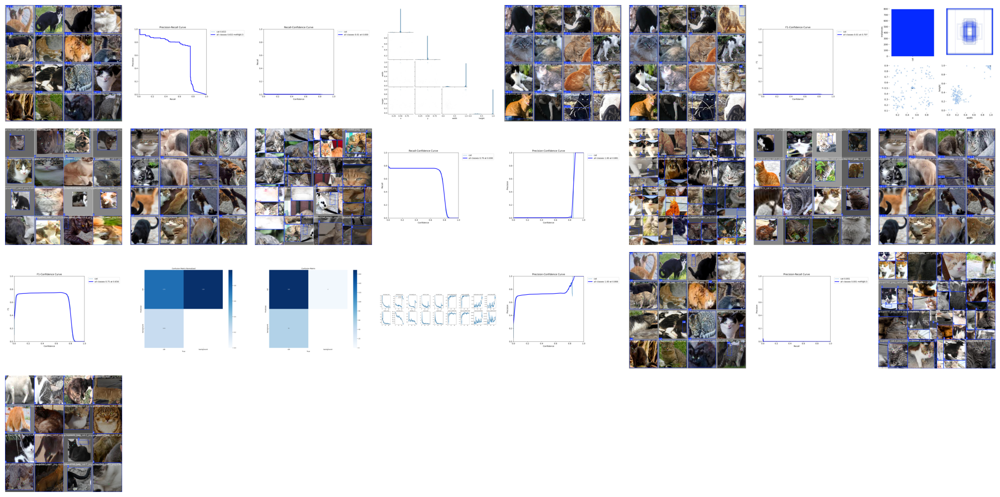

In [ ]:
import matplotlib.pyplot as plt
import os
from PIL import Image

# 이미지가 저장된 경로
image_dir = '/content/runs/pose/train2/'
# /content/runs/pose/train2/BoxF1_curve.png
# PNG 및 JPG 파일 목록 가져오기
image_files = [f for f in os.listdir(image_dir) if f.endswith('.png') or f.endswith('.jpg')]

if not image_files:
    raise ValueError("디렉토리에 PNG 또는 JPG 파일이 없습니다.")

# 이미지 읽기
images = [Image.open(os.path.join(image_dir, file)) for file in image_files]

# 이미지 표시 (8열로)
num_columns = 8
num_rows = (len(images) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, num_rows * 2.5))

for i, image in enumerate(images):
    row = i // num_columns
    col = i % num_columns
    axes[row, col].imshow(image)
    axes[row, col].axis('off')

# 남은 빈 칸의 축 제거
for i in range(len(images), num_rows * num_columns):
    row = i // num_columns
    col = i % num_columns
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()
